In [1]:
import torch
import numpy as np
import gymnasium as gym
from gymnasium import spaces
from transformers import ViTConfig
from stable_baselines3 import PPO
from typing import List

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import defaultdict
import json

/home/eunseo/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-05-28 16:35:48.204982: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748417748.219779 1176650 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748417748.224278 1176650 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1748417748.238068 1176650 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00

### 0. 가장 기본 Model

In [24]:
class FixedViTMDPEnvironment(gym.Env):
    """Improved ViT MDP environment for pruning."""
    def __init__(self, model_name="google/vit-base-patch16-224", debug=True):
        super().__init__()
        self.debug = debug

        self.config = ViTConfig.from_pretrained(model_name)
        self.num_layers = self.config.num_hidden_layers
        self.num_heads = self.config.num_attention_heads

        self.observation_space = spaces.Box(
            low=0.0, high=1.0, shape=(4,), dtype=np.float32
        )
        self.action_space = spaces.Box(
            low=np.array([0.0, 0.0, 0.0], dtype=np.float32),
            high=np.array([0.7, 0.7, 1.0], dtype=np.float32),
            dtype=np.float32
        )
        self.reset()

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.current_layer = 0
        self.total_reward = 0.0
        self.layer_states = [
            {
                'heads_remaining': 1.0,
                'ffn_size_ratio': 1.0,
                'is_active': True,
                'original_heads': self.num_heads,
                'original_ffn_size': 3072
            } for _ in range(self.num_layers)
        ]
        return self._get_current_state(), {}

    def _get_current_state(self):
        progress = self.current_layer / self.num_layers
        avg_heads = np.mean([ls['heads_remaining'] for ls in self.layer_states])
        avg_ffn = np.mean([ls['ffn_size_ratio'] for ls in self.layer_states])
        active_ratio = sum(ls['is_active'] for ls in self.layer_states) / self.num_layers
        return np.array([progress, avg_heads, avg_ffn, active_ratio], dtype=np.float32)

    def step(self, action):
        head_ratio, ffn_ratio, skip_prob = map(float, action)
        if self.debug:
            print(f"\n[Step] Layer {self.current_layer} | Action: heads={head_ratio:.2f}, ffn={ffn_ratio:.2f}, skip_prob={skip_prob:.2f}")
        reward = self._apply_action(self.current_layer, head_ratio, ffn_ratio, skip_prob)
        self.total_reward += reward
        self.current_layer += 1
        terminated = self.current_layer >= self.num_layers

        if terminated:
            final_bonus = self._calculate_final_bonus()
            reward += final_bonus
            self.total_reward += final_bonus
            if self.debug:
                print(f"[Episode End] Total Reward: {self.total_reward:.2f}, Final Bonus: {final_bonus:.2f}")

        next_state = self._get_current_state()
        info = {
            'layer': self.current_layer - 1,
            'total_reward': self.total_reward,
            'compression_ratio': self._calculate_compression_ratio(),
            'active_layers': sum(ls['is_active'] for ls in self.layer_states)
        }
        return next_state, reward, terminated, False, info

    def _apply_action(self, idx, head_prune, ffn_prune, skip_prob):
        if idx >= len(self.layer_states):
            return 0.0
        state = self.layer_states[idx]
        prev_heads = state['heads_remaining']
        prev_ffn = state['ffn_size_ratio']
        state['heads_remaining'] = max(0.1, prev_heads * (1 - head_prune))
        state['ffn_size_ratio'] = max(0.1, prev_ffn * (1 - ffn_prune))
        if skip_prob > 0.5:
            state['is_active'] = False
        if self.debug:
            print(f"  → heads_remaining: {state['heads_remaining']:.2f}, ffn_size_ratio: {state['ffn_size_ratio']:.2f}, is_active: {state['is_active']}")
        return self._calculate_step_reward(idx, head_prune, ffn_prune, skip_prob, prev_heads, prev_ffn, state['is_active'])

    def _calculate_step_reward(self, idx, head_prune, ffn_prune, skip_prob, prev_heads, prev_ffn, active):
        head_comp = head_prune * prev_heads
        ffn_comp = ffn_prune * prev_ffn
        skip_comp = 1.0 if not active else 0.0
        comp_reward = head_comp * 0.6 + ffn_comp * 0.8 + skip_comp * 1.2
        importance = self._layer_importance(idx)
        perf_penalty = head_prune * 0.2 * importance + ffn_prune * 0.3 * importance + skip_comp * 0.6 * importance
        return 20.0 * (comp_reward - perf_penalty)

    def _layer_importance(self, idx):
        pos = idx / (self.num_layers - 1)
        if pos < 0.3:
            return 1.2
        elif pos > 0.7:
            return 1.1
        return 1.0

    def _calculate_final_bonus(self):
        comp_ratio = self._calculate_compression_ratio()
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        bonus = comp_ratio * 60.0
        penalty = 10.0 if active_count < self.num_layers * 0.3 else 0.0
        return bonus - penalty

    def _calculate_compression_ratio(self):
        total_orig = total_curr = 0.0
        for ls in self.layer_states:
            if ls['is_active']:
                head_p = ls['original_heads'] * ls['heads_remaining'] * 64 * 768
                ffn_p = ls['original_ffn_size'] * ls['ffn_size_ratio'] * 768
                total_curr += head_p + ffn_p
            total_orig += ls['original_heads'] * 64 * 768 + ls['original_ffn_size'] * 768
        return max(0.0, min(1.0, 1.0 - (total_curr / total_orig)))

def train_fixed_agent():
    env = FixedViTMDPEnvironment(debug=True)
    model = PPO("MlpPolicy", env, verbose=1, n_steps=512, batch_size=32, n_epochs=5, learning_rate=5e-4, ent_coef=0.2)
    model.learn(total_timesteps=3000)
    for ep in range(10):
        obs, _ = env.reset()
        done = False
        total_reward = 0
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, reward, done, _, info = env.step(action)
            total_reward += reward
        print(f"Episode {ep+1}: Reward={info['total_reward']:.2f}, Compression={info['compression_ratio']:.2%}, Active Layers={info['active_layers']}/{env.num_layers}")

if __name__ == "__main__":
    train_fixed_agent()

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/home/eunseo/.local/lib/python3.10/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(



[Step] Layer 0 | Action: heads=0.00, ffn=0.70, skip_prob=0.42
  → heads_remaining: 1.00, ffn_size_ratio: 0.30, is_active: True

[Step] Layer 1 | Action: heads=0.70, ffn=0.00, skip_prob=1.00
  → heads_remaining: 0.30, ffn_size_ratio: 1.00, is_active: False

[Step] Layer 2 | Action: heads=0.00, ffn=0.00, skip_prob=0.72
  → heads_remaining: 1.00, ffn_size_ratio: 1.00, is_active: False

[Step] Layer 3 | Action: heads=0.00, ffn=0.70, skip_prob=0.00
  → heads_remaining: 1.00, ffn_size_ratio: 0.30, is_active: True

[Step] Layer 4 | Action: heads=0.00, ffn=0.70, skip_prob=0.00
  → heads_remaining: 1.00, ffn_size_ratio: 0.30, is_active: True

[Step] Layer 5 | Action: heads=0.00, ffn=0.08, skip_prob=0.00
  → heads_remaining: 1.00, ffn_size_ratio: 0.92, is_active: True

[Step] Layer 6 | Action: heads=0.00, ffn=0.70, skip_prob=0.00
  → heads_remaining: 1.00, ffn_size_ratio: 0.30, is_active: True

[Step] Layer 7 | Action: heads=0.00, ffn=0.00, skip_prob=0.00
  → heads_remaining: 1.00, ffn_size_rat


[Step] Layer 9 | Action: heads=0.70, ffn=0.70, skip_prob=0.00
  → heads_remaining: 0.30, ffn_size_ratio: 0.30, is_active: True

[Step] Layer 10 | Action: heads=0.44, ffn=0.57, skip_prob=1.00
  → heads_remaining: 0.56, ffn_size_ratio: 0.43, is_active: False

[Step] Layer 11 | Action: heads=0.00, ffn=0.00, skip_prob=0.00
  → heads_remaining: 1.00, ffn_size_ratio: 1.00, is_active: True
[Episode End] Total Reward: 108.22, Final Bonus: 27.22

[Step] Layer 0 | Action: heads=0.70, ffn=0.70, skip_prob=0.00
  → heads_remaining: 0.30, ffn_size_ratio: 0.30, is_active: True

[Step] Layer 1 | Action: heads=0.32, ffn=0.27, skip_prob=0.00
  → heads_remaining: 0.68, ffn_size_ratio: 0.73, is_active: True

[Step] Layer 2 | Action: heads=0.70, ffn=0.00, skip_prob=0.23
  → heads_remaining: 0.30, ffn_size_ratio: 1.00, is_active: True

[Step] Layer 3 | Action: heads=0.07, ffn=0.00, skip_prob=0.00
  → heads_remaining: 0.93, ffn_size_ratio: 1.00, is_active: True

[Step] Layer 4 | Action: heads=0.00, ffn=0.00

KeyboardInterrupt: 

### 1. 시각화 추가

Initializing Enhanced ViT MDP Environment...
Training PPO Agent...
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/home/eunseo/.local/lib/python3.10/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


\n[Step] Layer 0 | Action: heads=0.00, ffn=0.00, skip_prob=0.29
  → heads_remaining: 1.00, ffn_size_ratio: 1.00, is_active: True
  State Transition:
    Before: progress=0.000, avg_heads=1.000, avg_ffn=1.000, active_ratio=1.000
    After:  progress=0.000, avg_heads=1.000, avg_ffn=1.000, active_ratio=1.000
  Reward Breakdown:
    Compression: 0.000 (head:0.000, ffn:0.000, skip:0.000)
    Penalty: 0.000 (importance:1.20)
    Total: 0.000
\n[Step] Layer 1 | Action: heads=0.00, ffn=0.70, skip_prob=0.00
  → heads_remaining: 1.00, ffn_size_ratio: 0.30, is_active: True
  State Transition:
    Before: progress=0.083, avg_heads=1.000, avg_ffn=1.000, active_ratio=1.000
    After:  progress=0.083, avg_heads=1.000, avg_ffn=0.942, active_ratio=1.000
  Reward Breakdown:
    Compression: 0.560 (head:0.000, ffn:0.700, skip:0.000)
    Penalty: 0.252 (importance:1.20)
    Total: 6.160
\n[Step] Layer 2 | Action: heads=0.25, ffn=0.00, skip_prob=0.24
  → heads_remaining: 0.75, ffn_size_ratio: 1.00, is_acti

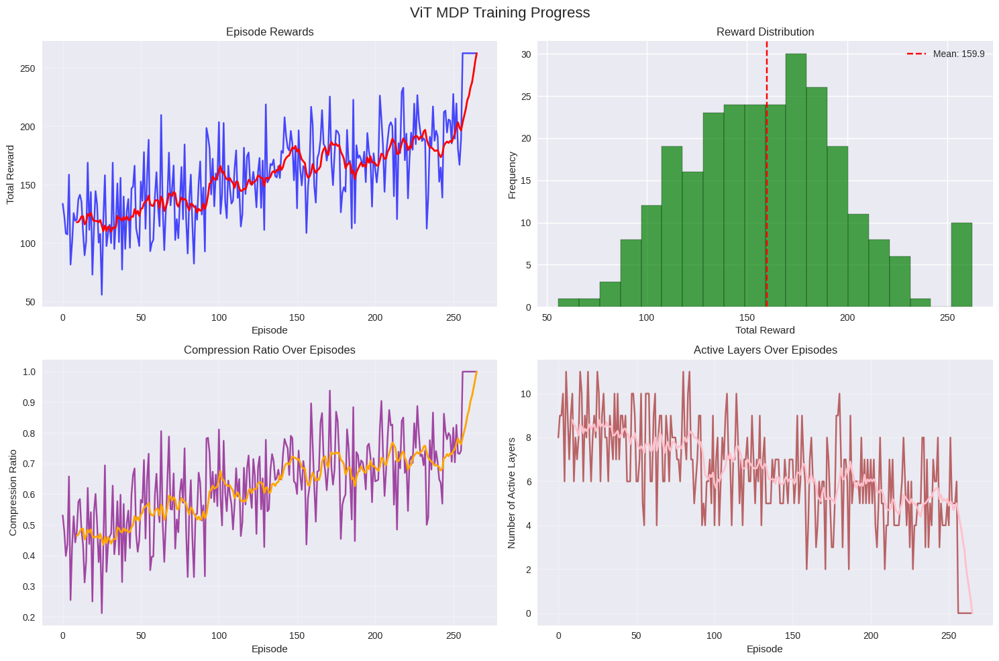

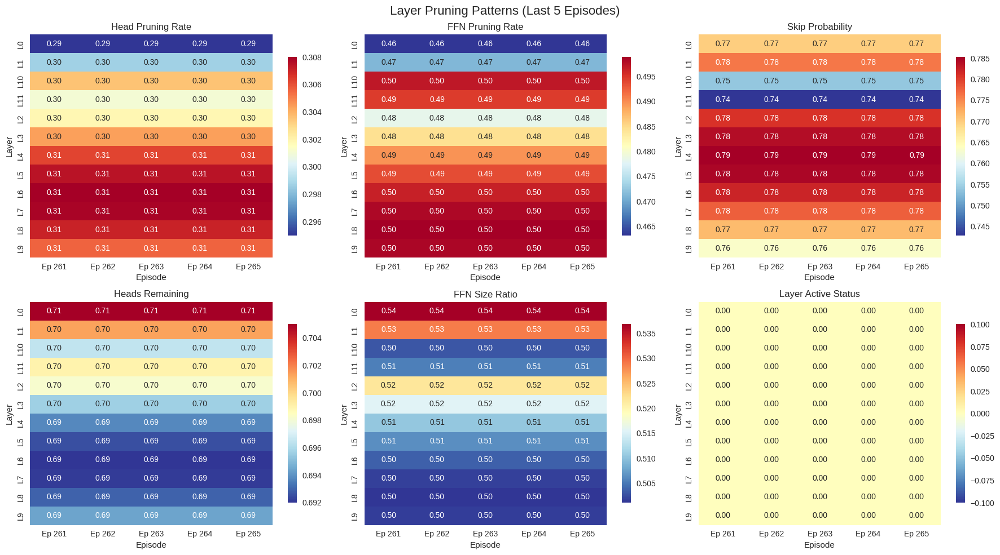

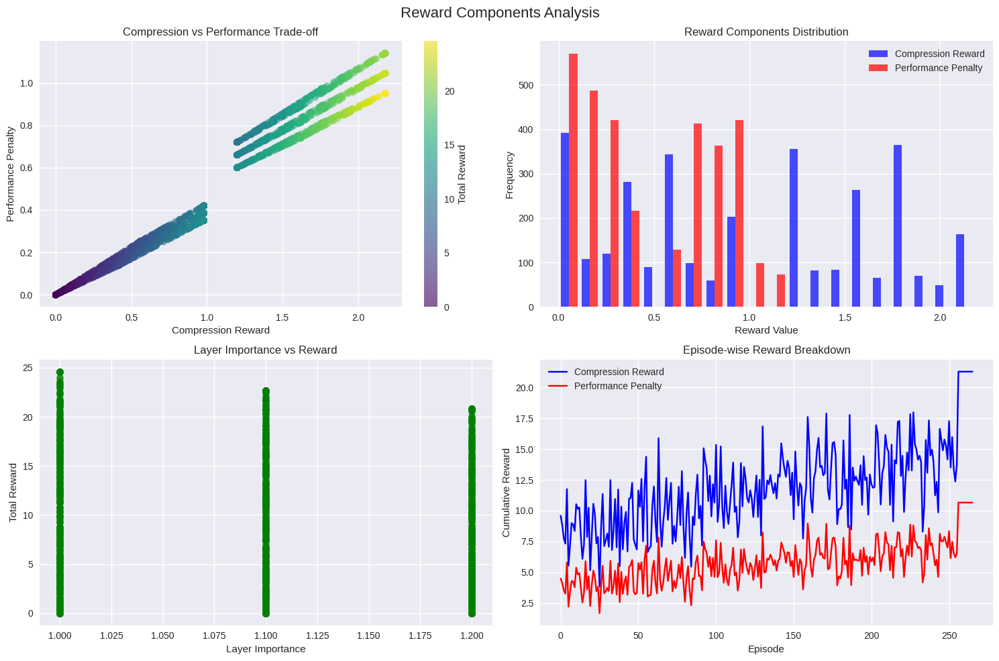

Detailed results saved to vit_mdp_detailed_results.json
\nTraining completed! Check the generated plots and JSON file for detailed results.


In [ ]:
class EnhancedViTMDPEnvironment(gym.Env):
    """Enhanced ViT MDP environment with detailed tracking and visualization."""
    
    def __init__(self, model_name="google/vit-base-patch16-224", debug=True):
        super().__init__()
        self.debug = debug
        
        # Model configuration
        self.config = ViTConfig.from_pretrained(model_name)
        self.num_layers = self.config.num_hidden_layers
        self.num_heads = self.config.num_attention_heads
        
        # Spaces
        self.observation_space = spaces.Box(
            low=0.0, high=1.0, shape=(4,), dtype=np.float32
        )
        self.action_space = spaces.Box(
            low=np.array([0.0, 0.0, 0.0], dtype=np.float32),
            high=np.array([0.7, 0.7, 1.0], dtype=np.float32),
            dtype=np.float32
        )
        
        # Tracking variables
        self.episode_transitions = []
        self.episode_rewards = []
        self.all_episodes_data = []
        self.episode_count = 0
        
        self.reset()

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        # Reset episode state
        self.current_layer = 0
        self.total_reward = 0.0
        self.episode_transitions = []
        
        # Initialize layer states
        self.layer_states = [
            {
                'heads_remaining': 1.0,
                'ffn_size_ratio': 1.0,
                'is_active': True,
                'original_heads': self.num_heads,
                'original_ffn_size': 3072
            } for _ in range(self.num_layers)
        ]
        
        initial_state = self._get_current_state()
        return initial_state, {}

    def _get_current_state(self):
        """Get current state representation."""
        progress = self.current_layer / self.num_layers
        avg_heads = np.mean([ls['heads_remaining'] for ls in self.layer_states])
        avg_ffn = np.mean([ls['ffn_size_ratio'] for ls in self.layer_states])
        active_ratio = sum(ls['is_active'] for ls in self.layer_states) / self.num_layers
        
        return np.array([progress, avg_heads, avg_ffn, active_ratio], dtype=np.float32)

    def step(self, action):
        head_ratio, ffn_ratio, skip_prob = map(float, action)
        
        # Store previous state for transition tracking
        prev_state = self._get_current_state().copy()
        
        if self.debug:
            print(f"\\n[Step] Layer {self.current_layer} | Action: heads={head_ratio:.2f}, ffn={ffn_ratio:.2f}, skip_prob={skip_prob:.2f}")
        
        # Apply action and calculate reward
        reward_components = self._apply_action_with_details(
            self.current_layer, head_ratio, ffn_ratio, skip_prob
        )
        
        step_reward = reward_components['total_reward']
        self.total_reward += step_reward
        
        # Get new state after action
        new_state = self._get_current_state()
        
        # Store transition information
        transition_info = {
            'layer': self.current_layer,
            'prev_state': prev_state,
            'action': [head_ratio, ffn_ratio, skip_prob],
            'new_state': new_state,
            'reward_components': reward_components,
            'layer_state_after': self.layer_states[self.current_layer].copy()
        }
        self.episode_transitions.append(transition_info)
        
        if self.debug:
            self._print_transition_details(transition_info)
        
        # Move to next layer
        self.current_layer += 1
        terminated = self.current_layer >= self.num_layers
        
        # Calculate final bonus if episode ended
        if terminated:
            final_bonus = self._calculate_final_bonus()
            step_reward += final_bonus
            self.total_reward += final_bonus
            
            # Store episode data
            episode_data = {
                'episode': self.episode_count,
                'total_reward': self.total_reward,
                'final_bonus': final_bonus,
                'compression_ratio': self._calculate_compression_ratio(),
                'active_layers': sum(ls['is_active'] for ls in self.layer_states),
                'transitions': self.episode_transitions.copy()
            }
            self.all_episodes_data.append(episode_data)
            self.episode_rewards.append(self.total_reward)
            self.episode_count += 1
            
            if self.debug:
                print(f"[Episode End] Total Reward: {self.total_reward:.2f}, Final Bonus: {final_bonus:.2f}")
                print(f"Compression Ratio: {self._calculate_compression_ratio():.2%}")

        next_state = self._get_current_state()
        info = {
            'layer': self.current_layer - 1,
            'total_reward': self.total_reward,
            'compression_ratio': self._calculate_compression_ratio(),
            'active_layers': sum(ls['is_active'] for ls in self.layer_states),
            'transition_info': transition_info if not terminated else None
        }
        
        return next_state, step_reward, terminated, False, info

    def _apply_action_with_details(self, idx, head_prune, ffn_prune, skip_prob):
        """Apply action and return detailed reward components."""
        if idx >= len(self.layer_states):
            return {'total_reward': 0.0, 'compression_reward': 0.0, 'performance_penalty': 0.0}
        
        state = self.layer_states[idx]
        prev_heads = state['heads_remaining']
        prev_ffn = state['ffn_size_ratio']
        
        # Update layer state
        state['heads_remaining'] = max(0.1, prev_heads * (1 - head_prune))
        state['ffn_size_ratio'] = max(0.1, prev_ffn * (1 - ffn_prune))
        
        # Determine if layer is skipped
        if skip_prob > 0.5:
            state['is_active'] = False
        
        if self.debug:
            print(f"  → heads_remaining: {state['heads_remaining']:.2f}, ffn_size_ratio: {state['ffn_size_ratio']:.2f}, is_active: {state['is_active']}")
        
        # Calculate detailed reward components
        return self._calculate_step_reward_detailed(
            idx, head_prune, ffn_prune, skip_prob, prev_heads, prev_ffn, state['is_active']
        )

    def _calculate_step_reward_detailed(self, idx, head_prune, ffn_prune, skip_prob, prev_heads, prev_ffn, active):
        """Calculate step reward with detailed breakdown."""
        # Compression rewards
        head_comp = head_prune * prev_heads
        ffn_comp = ffn_prune * prev_ffn
        skip_comp = 1.0 if not active else 0.0
        
        compression_reward = head_comp * 0.6 + ffn_comp * 0.8 + skip_comp * 1.2
        
        # Performance penalties
        importance = self._layer_importance(idx)
        perf_penalty = (head_prune * 0.2 * importance + 
                       ffn_prune * 0.3 * importance + 
                       skip_comp * 0.6 * importance)
        
        total_reward = 20.0 * (compression_reward - perf_penalty)
        
        return {
            'total_reward': total_reward,
            'compression_reward': compression_reward,
            'performance_penalty': perf_penalty,
            'head_compression': head_comp,
            'ffn_compression': ffn_comp,
            'skip_compression': skip_comp,
            'layer_importance': importance,
            'raw_reward': compression_reward - perf_penalty
        }

    def _print_transition_details(self, transition_info):
        """Print detailed transition information."""
        layer = transition_info['layer']
        prev_state = transition_info['prev_state']
        action = transition_info['action']
        new_state = transition_info['new_state']
        reward_comp = transition_info['reward_components']
        
        print(f"  State Transition:")
        print(f"    Before: progress={prev_state[0]:.3f}, avg_heads={prev_state[1]:.3f}, avg_ffn={prev_state[2]:.3f}, active_ratio={prev_state[3]:.3f}")
        print(f"    After:  progress={new_state[0]:.3f}, avg_heads={new_state[1]:.3f}, avg_ffn={new_state[2]:.3f}, active_ratio={new_state[3]:.3f}")
        print(f"  Reward Breakdown:")
        print(f"    Compression: {reward_comp['compression_reward']:.3f} (head:{reward_comp['head_compression']:.3f}, ffn:{reward_comp['ffn_compression']:.3f}, skip:{reward_comp['skip_compression']:.3f})")
        print(f"    Penalty: {reward_comp['performance_penalty']:.3f} (importance:{reward_comp['layer_importance']:.2f})")
        print(f"    Total: {reward_comp['total_reward']:.3f}")

    def _layer_importance(self, idx):
        """Calculate layer importance based on position."""
        pos = idx / (self.num_layers - 1)
        if pos < 0.3:  # Early layers
            return 1.2
        elif pos > 0.7:  # Late layers  
            return 1.1
        return 1.0  # Middle layers

    def _calculate_final_bonus(self):
        """Calculate final episode bonus."""
        comp_ratio = self._calculate_compression_ratio()
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        
        bonus = comp_ratio * 60.0
        penalty = 10.0 if active_count < self.num_layers * 0.3 else 0.0
        
        return bonus - penalty

    def _calculate_compression_ratio(self):
        """Calculate overall compression ratio."""
        total_orig = total_curr = 0.0
        
        for ls in self.layer_states:
            # Original parameters
            head_orig = ls['original_heads'] * 64 * 768
            ffn_orig = ls['original_ffn_size'] * 768
            total_orig += head_orig + ffn_orig
            
            # Current parameters (only count if active)
            if ls['is_active']:
                head_curr = ls['original_heads'] * ls['heads_remaining'] * 64 * 768
                ffn_curr = ls['original_ffn_size'] * ls['ffn_size_ratio'] * 768
                total_curr += head_curr + ffn_curr
        
        return max(0.0, min(1.0, 1.0 - (total_curr / total_orig)))

    def get_episode_data(self):
        """Return all collected episode data."""
        return self.all_episodes_data

    def get_reward_history(self):
        """Return episode reward history."""
        return self.episode_rewards


class ViTMDPVisualizer:
    """Visualization tools for ViT MDP training results."""
    
    def __init__(self, env):
        self.env = env
        plt.style.use('seaborn-v0_8')
        
    def plot_training_progress(self, save_path=None):
        """Plot training progress over episodes."""
        rewards = self.env.get_reward_history()
        
        if len(rewards) == 0:
            print("No training data available for plotting.")
            return
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle('ViT MDP Training Progress', fontsize=16)
        
        # Episode rewards
        axes[0,0].plot(rewards, alpha=0.7, color='blue')
        axes[0,0].plot(pd.Series(rewards).rolling(10).mean(), color='red', linewidth=2)
        axes[0,0].set_title('Episode Rewards')
        axes[0,0].set_xlabel('Episode')
        axes[0,0].set_ylabel('Total Reward')
        axes[0,0].grid(True, alpha=0.3)
        
        # Reward distribution
        axes[0,1].hist(rewards, bins=20, alpha=0.7, color='green', edgecolor='black')
        axes[0,1].axvline(np.mean(rewards), color='red', linestyle='--', 
                         label=f'Mean: {np.mean(rewards):.1f}')
        axes[0,1].set_title('Reward Distribution')
        axes[0,1].set_xlabel('Total Reward')
        axes[0,1].set_ylabel('Frequency')
        axes[0,1].legend()
        
        # Compression ratio over episodes
        episode_data = self.env.get_episode_data()
        if episode_data:
            comp_ratios = [ep['compression_ratio'] for ep in episode_data]
            axes[1,0].plot(comp_ratios, alpha=0.7, color='purple')
            axes[1,0].plot(pd.Series(comp_ratios).rolling(10).mean(), color='orange', linewidth=2)
            axes[1,0].set_title('Compression Ratio Over Episodes')
            axes[1,0].set_xlabel('Episode')
            axes[1,0].set_ylabel('Compression Ratio')
            axes[1,0].grid(True, alpha=0.3)
            
            # Active layers over episodes
            active_layers = [ep['active_layers'] for ep in episode_data]
            axes[1,1].plot(active_layers, alpha=0.7, color='brown')
            axes[1,1].plot(pd.Series(active_layers).rolling(10).mean(), color='pink', linewidth=2)
            axes[1,1].set_title('Active Layers Over Episodes')
            axes[1,1].set_xlabel('Episode')
            axes[1,1].set_ylabel('Number of Active Layers')
            axes[1,1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    def plot_layer_pruning_patterns(self, num_episodes=5, save_path=None):
        """Plot pruning patterns across layers for recent episodes."""
        episode_data = self.env.get_episode_data()
        
        if len(episode_data) < num_episodes:
            print(f"Only {len(episode_data)} episodes available.")
            num_episodes = len(episode_data)
        
        # Get data from last few episodes
        recent_episodes = episode_data[-num_episodes:]
        
        # Create data for heatmap
        layer_data = defaultdict(list)
        
        for ep in recent_episodes:
            for transition in ep['transitions']:
                layer = transition['layer']
                action = transition['action']
                layer_state = transition['layer_state_after']
                
                layer_data['Episode'].append(f"Ep {ep['episode']}")
                layer_data['Layer'].append(f"L{layer}")
                layer_data['Head_Prune'].append(action[0])
                layer_data['FFN_Prune'].append(action[1])
                layer_data['Skip_Prob'].append(action[2])
                layer_data['Heads_Remaining'].append(layer_state['heads_remaining'])
                layer_data['FFN_Ratio'].append(layer_state['ffn_size_ratio'])
                layer_data['Is_Active'].append(1.0 if layer_state['is_active'] else 0.0)
        
        df = pd.DataFrame(layer_data)
        
        # Create subplots
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        fig.suptitle(f'Layer Pruning Patterns (Last {num_episodes} Episodes)', fontsize=16)
        
        # Pivot tables for heatmaps
        metrics = ['Head_Prune', 'FFN_Prune', 'Skip_Prob', 'Heads_Remaining', 'FFN_Ratio', 'Is_Active']
        titles = ['Head Pruning Rate', 'FFN Pruning Rate', 'Skip Probability', 
                 'Heads Remaining', 'FFN Size Ratio', 'Layer Active Status']
        
        for i, (metric, title) in enumerate(zip(metrics, titles)):
            row, col = i // 3, i % 3
            
            # Create pivot table
            pivot_data = df.pivot_table(values=metric, index='Layer', columns='Episode', aggfunc='mean')
            
            # Create heatmap
            sns.heatmap(pivot_data, annot=True, fmt='.2f', cmap='RdYlBu_r', 
                       ax=axes[row, col], cbar_kws={'shrink': 0.8})
            axes[row, col].set_title(title)
            axes[row, col].set_xlabel('Episode')
            axes[row, col].set_ylabel('Layer')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    def plot_reward_components_analysis(self, save_path=None):
        """Analyze reward components across episodes."""
        episode_data = self.env.get_episode_data()
        
        if not episode_data:
            print("No episode data available.")
            return
        
        # Collect reward component data
        comp_rewards = []
        perf_penalties = []
        total_rewards = []
        layer_importances = []
        
        for ep in episode_data:
            for transition in ep['transitions']:
                reward_comp = transition['reward_components']
                comp_rewards.append(reward_comp['compression_reward'])
                perf_penalties.append(reward_comp['performance_penalty'])
                total_rewards.append(reward_comp['total_reward'])
                layer_importances.append(reward_comp['layer_importance'])
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle('Reward Components Analysis', fontsize=16)
        
        # Compression vs Performance scatter
        axes[0,0].scatter(comp_rewards, perf_penalties, alpha=0.6, c=total_rewards, cmap='viridis')
        axes[0,0].set_xlabel('Compression Reward')
        axes[0,0].set_ylabel('Performance Penalty')
        axes[0,0].set_title('Compression vs Performance Trade-off')
        colorbar = plt.colorbar(axes[0,0].collections[0], ax=axes[0,0])
        colorbar.set_label('Total Reward')
        
        # Reward components distribution
        axes[0,1].hist([comp_rewards, perf_penalties], bins=20, alpha=0.7, 
                      label=['Compression Reward', 'Performance Penalty'], color=['blue', 'red'])
        axes[0,1].set_xlabel('Reward Value')
        axes[0,1].set_ylabel('Frequency')
        axes[0,1].set_title('Reward Components Distribution')
        axes[0,1].legend()
        
        # Layer importance impact
        axes[1,0].scatter(layer_importances, total_rewards, alpha=0.6, color='green')
        axes[1,0].set_xlabel('Layer Importance')
        axes[1,0].set_ylabel('Total Reward')
        axes[1,0].set_title('Layer Importance vs Reward')
        
        # Episode-wise reward breakdown
        episode_comp_rewards = []
        episode_penalties = []
        
        for ep in episode_data:
            ep_comp = sum(t['reward_components']['compression_reward'] for t in ep['transitions'])
            ep_penalty = sum(t['reward_components']['performance_penalty'] for t in ep['transitions'])
            episode_comp_rewards.append(ep_comp)
            episode_penalties.append(ep_penalty)
        
        episodes = range(len(episode_data))
        axes[1,1].plot(episodes, episode_comp_rewards, label='Compression Reward', color='blue')
        axes[1,1].plot(episodes, episode_penalties, label='Performance Penalty', color='red')
        axes[1,1].set_xlabel('Episode')
        axes[1,1].set_ylabel('Cumulative Reward')
        axes[1,1].set_title('Episode-wise Reward Breakdown')
        axes[1,1].legend()
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    def save_detailed_results(self, filepath='vit_mdp_results.json'):
        """Save detailed results to JSON file."""
        episode_data = self.env.get_episode_data()
        
        # Convert numpy arrays to lists for JSON serialization
        def convert_numpy(obj):
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            elif isinstance(obj, np.float32):
                return float(obj)
            return obj
        
        # Process data for JSON
        json_data = []
        for ep in episode_data:
            ep_data = ep.copy()
            
            # Convert transitions
            for transition in ep_data['transitions']:
                transition['prev_state'] = convert_numpy(transition['prev_state'])
                transition['new_state'] = convert_numpy(transition['new_state'])
                transition['action'] = convert_numpy(transition['action'])
            
            json_data.append(ep_data)
        
        with open(filepath, 'w') as f:
            json.dump(json_data, f, indent=2, default=convert_numpy)
        
        print(f"Detailed results saved to {filepath}")


def train_enhanced_agent():
    """Train agent with enhanced tracking and visualization."""
    print("Initializing Enhanced ViT MDP Environment...")
    env = EnhancedViTMDPEnvironment(debug=True)
    visualizer = ViTMDPVisualizer(env)
    
    print("Training PPO Agent...")
    model = PPO(
        "MlpPolicy", 
        env, 
        verbose=1, 
        n_steps=512, 
        batch_size=32, 
        n_epochs=5, 
        learning_rate=5e-4, 
        ent_coef=0.2
    )
    
    # Train the model
    model.learn(total_timesteps=3000)
    
    print("\\nRunning evaluation episodes...")
    # Run evaluation episodes
    for ep in range(10):
        obs, _ = env.reset()
        done = False
        total_reward = 0
        
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, reward, done, _, info = env.step(action)
            total_reward += reward
        
        print(f"Episode {ep+1}: Reward={info['total_reward']:.2f}, "
              f"Compression={info['compression_ratio']:.2%}, "
              f"Active Layers={info['active_layers']}/{env.num_layers}")
    
    print("\\nGenerating visualizations...")
    
    # Generate all visualizations
    visualizer.plot_training_progress(save_path='training_progress.png')
    visualizer.plot_layer_pruning_patterns(num_episodes=5, save_path='pruning_patterns.png')
    visualizer.plot_reward_components_analysis(save_path='reward_analysis.png')
    
    # Save detailed results
    visualizer.save_detailed_results('vit_mdp_detailed_results.json')
    
    print("\\nTraining completed! Check the generated plots and JSON file for detailed results.")
    
    return model, env, visualizer


if __name__ == "__main__":
    model, env, visualizer = train_enhanced_agent()

### 2. 모니터링 기능 추가

In [ ]:
# import gym
# from gym import spaces
# import numpy as np
# from transformers import ViTConfig
# from stable_baselines3 import PPO
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# from collections import defaultdict
# import json

class ImprovedViTMDPEnvironment(gym.Env):
    """Improved ViT MDP environment with practical constraints and realistic rewards."""
    
    def __init__(self, model_name="google/vit-base-patch16-224", debug=True):
        super().__init__()
        self.debug = debug
        
        # Model configuration
        self.config = ViTConfig.from_pretrained(model_name)
        self.num_layers = self.config.num_hidden_layers
        self.num_heads = self.config.num_attention_heads
        
        # Practical constraints
        self.min_active_layers = max(3, int(self.num_layers * 0.25))  # At least 25% layers active
        self.min_heads_ratio = 0.3  # At least 30% heads must remain
        self.min_ffn_ratio = 0.2    # At least 20% FFN must remain
        self.max_skip_layers = int(self.num_layers * 0.5)  # Max 50% layers can be skipped
        
        # Spaces
        self.observation_space = spaces.Box(
            low=0.0, high=1.0, shape=(6,), dtype=np.float32  # Extended state space
        )
        self.action_space = spaces.Box(
            low=np.array([0.0, 0.0, 0.0], dtype=np.float32),
            high=np.array([0.5, 0.5, 0.8], dtype=np.float32),  # Reduced action bounds
            dtype=np.float32
        )
        
        # Tracking variables
        self.episode_transitions = []
        self.episode_rewards = []
        self.all_episodes_data = []
        self.episode_count = 0
        
        self.reset()

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        # Reset episode state
        self.current_layer = 0
        self.total_reward = 0.0
        self.episode_transitions = []
        self.skipped_layers_count = 0
        
        # Initialize layer states
        self.layer_states = [
            {
                'heads_remaining': 1.0,
                'ffn_size_ratio': 1.0,
                'is_active': True,
                'original_heads': self.num_heads,
                'original_ffn_size': 3072
            } for _ in range(self.num_layers)
        ]
        
        initial_state = self._get_current_state()
        return initial_state, {}

    def _get_current_state(self):
        """Get enhanced state representation with more information."""
        progress = self.current_layer / self.num_layers
        avg_heads = np.mean([ls['heads_remaining'] for ls in self.layer_states])
        avg_ffn = np.mean([ls['ffn_size_ratio'] for ls in self.layer_states])
        active_ratio = sum(ls['is_active'] for ls in self.layer_states) / self.num_layers
        
        # Additional state features
        remaining_skip_budget = max(0, (self.max_skip_layers - self.skipped_layers_count) / self.num_layers)
        compression_so_far = self._calculate_compression_ratio()
        
        return np.array([
            progress, avg_heads, avg_ffn, active_ratio, 
            remaining_skip_budget, compression_so_far
        ], dtype=np.float32)

    def step(self, action):
        head_ratio, ffn_ratio, skip_prob = map(float, action)
        
        # Store previous state for transition tracking
        prev_state = self._get_current_state().copy()
        
        if self.debug:
            print(f"\\n[Step] Layer {self.current_layer} | Action: heads={head_ratio:.2f}, ffn={ffn_ratio:.2f}, skip_prob={skip_prob:.2f}")
        
        # Apply constraints and action
        reward_components = self._apply_constrained_action(
            self.current_layer, head_ratio, ffn_ratio, skip_prob
        )
        
        step_reward = reward_components['total_reward']
        self.total_reward += step_reward
        
        # Get new state after action
        new_state = self._get_current_state()
        
        # Store transition information
        transition_info = {
            'layer': self.current_layer,
            'prev_state': prev_state,
            'action': [head_ratio, ffn_ratio, skip_prob],
            'new_state': new_state,
            'reward_components': reward_components,
            'layer_state_after': self.layer_states[self.current_layer].copy(),
            'constraints_violated': reward_components.get('constraints_violated', [])
        }
        self.episode_transitions.append(transition_info)
        
        if self.debug:
            self._print_transition_details(transition_info)
        
        # Move to next layer
        self.current_layer += 1
        terminated = self.current_layer >= self.num_layers
        
        # Calculate final bonus if episode ended
        if terminated:
            final_bonus = self._calculate_realistic_final_bonus()
            step_reward += final_bonus
            self.total_reward += final_bonus
            
            # Store episode data
            episode_data = {
                'episode': self.episode_count,
                'total_reward': self.total_reward,
                'final_bonus': final_bonus,
                'compression_ratio': self._calculate_compression_ratio(),
                'active_layers': sum(ls['is_active'] for ls in self.layer_states),
                'transitions': self.episode_transitions.copy(),
                'is_valid_model': self._is_valid_model()
            }
            self.all_episodes_data.append(episode_data)
            self.episode_rewards.append(self.total_reward)
            self.episode_count += 1
            
            if self.debug:
                print(f"[Episode End] Total Reward: {self.total_reward:.2f}, Final Bonus: {final_bonus:.2f}")
                print(f"Compression Ratio: {self._calculate_compression_ratio():.2%}")
                print(f"Valid Model: {self._is_valid_model()}")

        next_state = self._get_current_state()
        info = {
            'layer': self.current_layer - 1,
            'total_reward': self.total_reward,
            'compression_ratio': self._calculate_compression_ratio(),
            'active_layers': sum(ls['is_active'] for ls in self.layer_states),
            'is_valid': self._is_valid_model(),
            'transition_info': transition_info if not terminated else None
        }
        
        return next_state, step_reward, terminated, False, info

    def _apply_constrained_action(self, idx, head_prune, ffn_prune, skip_prob):
        """Apply action with practical constraints."""
        if idx >= len(self.layer_states):
            return {'total_reward': 0.0, 'compression_reward': 0.0, 'performance_penalty': 0.0}
        
        state = self.layer_states[idx]
        prev_heads = state['heads_remaining']
        prev_ffn = state['ffn_size_ratio']
        constraints_violated = []
        
        # Apply skip constraint
        will_skip = skip_prob > 0.5 and self.skipped_layers_count < self.max_skip_layers
        
        # Critical layer protection (first, last 2 layers should remain active)
        is_critical_layer = idx in [0, self.num_layers-2, self.num_layers-1]
        if is_critical_layer:
            will_skip = False
            if skip_prob > 0.5:
                constraints_violated.append(f"Critical layer {idx} skip prevented")
        
        # Apply pruning with minimum constraints
        new_heads = max(self.min_heads_ratio, prev_heads * (1 - head_prune))
        new_ffn = max(self.min_ffn_ratio, prev_ffn * (1 - ffn_prune))
        
        # Check if pruning was constrained
        if new_heads == self.min_heads_ratio and prev_heads * (1 - head_prune) < self.min_heads_ratio:
            constraints_violated.append("Heads pruning limited to maintain minimum ratio")
        if new_ffn == self.min_ffn_ratio and prev_ffn * (1 - ffn_prune) < self.min_ffn_ratio:
            constraints_violated.append("FFN pruning limited to maintain minimum ratio")
        
        # Update layer state
        state['heads_remaining'] = new_heads
        state['ffn_size_ratio'] = new_ffn
        
        if will_skip:
            state['is_active'] = False
            self.skipped_layers_count += 1
        
        if self.debug:
            print(f"  → heads_remaining: {state['heads_remaining']:.2f}, ffn_size_ratio: {state['ffn_size_ratio']:.2f}, is_active: {state['is_active']}")
            if constraints_violated:
                for constraint in constraints_violated:
                    print(f"  ⚠️  {constraint}")
        
        # Calculate reward with constraint penalties
        reward_components = self._calculate_realistic_reward(
            idx, head_prune, ffn_prune, skip_prob, prev_heads, prev_ffn, 
            state['is_active'], constraints_violated
        )
        reward_components['constraints_violated'] = constraints_violated
        
        return reward_components

    def _calculate_realistic_reward(self, idx, head_prune, ffn_prune, skip_prob, 
                                  prev_heads, prev_ffn, active, constraints_violated):
        """Calculate realistic reward with balanced objectives."""
        
        # Actual compression achieved (not intended)
        actual_head_prune = prev_heads - max(self.min_heads_ratio, prev_heads * (1 - head_prune))
        actual_ffn_prune = prev_ffn - max(self.min_ffn_ratio, prev_ffn * (1 - ffn_prune))
        actual_skip = 1.0 if not active else 0.0
        
        # Compression rewards (more balanced weights)
        compression_reward = (actual_head_prune * 0.3 + 
                            actual_ffn_prune * 0.4 + 
                            actual_skip * 0.3)  # Reduced skip reward
        
        # Performance preservation (layer importance)
        importance = self._realistic_layer_importance(idx)
        performance_penalty = (actual_head_prune * 0.4 * importance + 
                             actual_ffn_prune * 0.3 * importance + 
                             actual_skip * 0.8 * importance)  # Higher skip penalty
        
        # Model functionality penalty
        functionality_penalty = 0.0
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        if active_count < self.min_active_layers:
            functionality_penalty = 2.0  # Strong penalty
        
        # Constraint violation penalty
        constraint_penalty = len(constraints_violated) * 0.1
        
        # Efficiency bonus (reward moderate compression)
        efficiency_bonus = 0.0
        total_compression = compression_reward
        if 0.2 <= total_compression <= 0.6:  # Sweet spot
            efficiency_bonus = 0.2
        
        # Calculate total reward (reduced multiplier for more stable learning)
        raw_reward = (compression_reward - performance_penalty - 
                     functionality_penalty - constraint_penalty + efficiency_bonus)
        total_reward = 10.0 * raw_reward  # Reduced from 20.0
        
        return {
            'total_reward': total_reward,
            'compression_reward': compression_reward,
            'performance_penalty': performance_penalty,
            'functionality_penalty': functionality_penalty,
            'constraint_penalty': constraint_penalty,
            'efficiency_bonus': efficiency_bonus,
            'actual_head_prune': actual_head_prune,
            'actual_ffn_prune': actual_ffn_prune,
            'actual_skip': actual_skip,
            'layer_importance': importance,
            'raw_reward': raw_reward
        }

    def _realistic_layer_importance(self, idx):
        """More nuanced layer importance calculation."""
        pos = idx / (self.num_layers - 1)
        
        # First and last layers are most critical
        if idx == 0 or idx == self.num_layers - 1:
            return 2.0
        elif idx == 1 or idx == self.num_layers - 2:
            return 1.5
        elif pos < 0.3 or pos > 0.7:  # Early/late layers
            return 1.3
        else:  # Middle layers
            return 1.0

    def _calculate_realistic_final_bonus(self):
        """Calculate realistic final bonus with model validity check."""
        if not self._is_valid_model():
            return -50.0  # Strong penalty for invalid models
        
        comp_ratio = self._calculate_compression_ratio()
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        
        # Reward moderate compression more than extreme compression
        if 0.2 <= comp_ratio <= 0.6:
            compression_bonus = comp_ratio * 40.0  # Reduced from 60.0
        elif comp_ratio > 0.6:
            compression_bonus = 40.0 * 0.6 - (comp_ratio - 0.6) * 20.0  # Diminishing returns
        else:
            compression_bonus = comp_ratio * 40.0
        
        # Stability bonus for maintaining reasonable number of active layers
        stability_bonus = 0.0
        if active_count >= self.min_active_layers:
            stability_bonus = 10.0
        
        return compression_bonus + stability_bonus

    def _is_valid_model(self):
        """Check if the resulting model is practically valid."""
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        
        # Must have minimum active layers
        if active_count < self.min_active_layers:
            return False
        
        # First layer must be active (feature extraction)
        if not self.layer_states[0]['is_active']:
            return False
        
        # Last layer must be active (classification)
        if not self.layer_states[-1]['is_active']:
            return False
        
        # Must have reasonable total capacity
        total_capacity = sum(
            ls['heads_remaining'] * ls['ffn_size_ratio'] 
            for ls in self.layer_states if ls['is_active']
        )
        min_required_capacity = len(self.layer_states) * 0.3
        
        return total_capacity >= min_required_capacity

    def _print_transition_details(self, transition_info):
        """Print detailed transition information."""
        layer = transition_info['layer']
        prev_state = transition_info['prev_state']
        action = transition_info['action']
        new_state = transition_info['new_state']
        reward_comp = transition_info['reward_components']
        constraints = transition_info['constraints_violated']
        
        print(f"  State Transition:")
        print(f"    Before: progress={prev_state[0]:.3f}, avg_heads={prev_state[1]:.3f}, avg_ffn={prev_state[2]:.3f}, active_ratio={prev_state[3]:.3f}")
        print(f"    After:  progress={new_state[0]:.3f}, avg_heads={new_state[1]:.3f}, avg_ffn={new_state[2]:.3f}, active_ratio={new_state[3]:.3f}")
        print(f"  Reward Breakdown:")
        print(f"    Compression: {reward_comp['compression_reward']:.3f}")
        print(f"    Performance Penalty: {reward_comp['performance_penalty']:.3f}")
        print(f"    Functionality Penalty: {reward_comp['functionality_penalty']:.3f}")
        print(f"    Efficiency Bonus: {reward_comp['efficiency_bonus']:.3f}")
        print(f"    Total: {reward_comp['total_reward']:.3f}")
        
        if constraints:
            print(f"  Constraints: {len(constraints)} violations")

    def _calculate_compression_ratio(self):
        """Calculate overall compression ratio."""
        total_orig = total_curr = 0.0
        
        for ls in self.layer_states:
            # Original parameters
            head_orig = ls['original_heads'] * 64 * 768
            ffn_orig = ls['original_ffn_size'] * 768
            total_orig += head_orig + ffn_orig
            
            # Current parameters (only count if active)
            if ls['is_active']:
                head_curr = ls['original_heads'] * ls['heads_remaining'] * 64 * 768
                ffn_curr = ls['original_ffn_size'] * ls['ffn_size_ratio'] * 768
                total_curr += head_curr + ffn_curr
        
        return max(0.0, min(1.0, 1.0 - (total_curr / total_orig)))

    def get_episode_data(self):
        """Return all collected episode data."""
        return self.all_episodes_data

    def get_reward_history(self):
        """Return episode reward history."""
        return self.episode_rewards

    def get_valid_episodes(self):
        """Return only episodes that resulted in valid models."""
        return [ep for ep in self.all_episodes_data if ep['is_valid_model']]


def train_improved_agent():
    """Train agent with improved environment."""
    print("Initializing Improved ViT MDP Environment...")
    env = ImprovedViTMDPEnvironment(debug=True)
    
    print("Training PPO Agent with improved settings...")
    model = PPO(
        "MlpPolicy", 
        env, 
        verbose=1, 
        n_steps=1024,        # Increased for better exploration
        batch_size=64,       # Increased batch size
        n_epochs=10,         # More update epochs
        learning_rate=3e-4,  # Slightly reduced learning rate
        ent_coef=0.1,        # Reduced entropy for more focused learning
        clip_range=0.2,
        gamma=0.99,
        gae_lambda=0.95
    )
    
    # Train the model
    model.learn(total_timesteps=5000)  # More training steps
    
    print("\\nRunning evaluation episodes...")
    # Run evaluation episodes
    for ep in range(15):  # More evaluation episodes
        obs, _ = env.reset()
        done = False
        total_reward = 0
        
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, reward, done, _, info = env.step(action)
            total_reward += reward
        
        valid_indicator = "✅" if info['is_valid'] else "❌"
        print(f"Episode {ep+1}: {valid_indicator} Reward={info['total_reward']:.2f}, "
              f"Compression={info['compression_ratio']:.2%}, "
              f"Active Layers={info['active_layers']}/{env.num_layers}")
    
    # Print summary statistics
    valid_episodes = env.get_valid_episodes()
    print(f"\\n📊 Summary:")
    print(f"Valid Models: {len(valid_episodes)}/{len(env.get_episode_data())} ({len(valid_episodes)/len(env.get_episode_data())*100:.1f}%)")
    
    if valid_episodes:
        avg_compression = np.mean([ep['compression_ratio'] for ep in valid_episodes])
        avg_active = np.mean([ep['active_layers'] for ep in valid_episodes])
        avg_reward = np.mean([ep['total_reward'] for ep in valid_episodes])
        
        print(f"Valid Models Average:")
        print(f"  - Compression: {avg_compression:.2%}")
        print(f"  - Active Layers: {avg_active:.1f}/{env.num_layers}")
        print(f"  - Reward: {avg_reward:.2f}")
    
    return model, env


if __name__ == "__main__":
    model, env = train_improved_agent()

Initializing Improved ViT MDP Environment...


Training PPO Agent with improved settings...
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/home/eunseo/.local/lib/python3.10/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


\n[Step] Layer 0 | Action: heads=0.23, ffn=0.00, skip_prob=0.16
  → heads_remaining: 0.77, ffn_size_ratio: 1.00, is_active: True
  State Transition:
    Before: progress=0.000, avg_heads=1.000, avg_ffn=1.000, active_ratio=1.000
    After:  progress=0.000, avg_heads=0.981, avg_ffn=1.000, active_ratio=1.000
  Reward Breakdown:
    Compression: 0.069
    Performance Penalty: 0.183
    Functionality Penalty: 0.000
    Efficiency Bonus: 0.000
    Total: -1.143
\n[Step] Layer 1 | Action: heads=0.00, ffn=0.00, skip_prob=0.70
  → heads_remaining: 1.00, ffn_size_ratio: 1.00, is_active: False
  State Transition:
    Before: progress=0.083, avg_heads=0.981, avg_ffn=1.000, active_ratio=1.000
    After:  progress=0.083, avg_heads=0.981, avg_ffn=1.000, active_ratio=0.917
  Reward Breakdown:
    Compression: 0.300
    Performance Penalty: 1.200
    Functionality Penalty: 0.000
    Efficiency Bonus: 0.200
    Total: -7.000
\n[Step] Layer 2 | Action: heads=0.50, ffn=0.00, skip_prob=0.00
  → heads_remai

### 3. 학습이 안 되는 문제 해결, 시각화 다시 추가

Choose training approach:
1. Standard improved training
2. Exploration-enhanced training


Initializing Exploration-Enhanced ViT MDP Environment...
Training PPO Agent with exploration enhancement...
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/home/eunseo/.local/lib/python3.10/site-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


\n[Step] Layer 0 | Action: heads=0.00, ffn=0.50, skip_prob=0.05
  → heads_remaining: 1.00, ffn_size_ratio: 0.50, is_active: True
  State Transition:
    Before: progress=0.000, avg_heads=1.000, avg_ffn=1.000, active_ratio=1.000
    After:  progress=0.000, avg_heads=1.000, avg_ffn=0.958, active_ratio=1.000
  Reward Breakdown:
    Compression: 0.200
    Performance Penalty: 0.200
    Functionality Penalty: 0.000
    Efficiency Bonus: 0.300
    Diversity Bonus: 0.000
    Total: 4.500
\n[Step] Layer 1 | Action: heads=0.50, ffn=0.00, skip_prob=0.00
  → heads_remaining: 0.50, ffn_size_ratio: 1.00, is_active: True
  State Transition:
    Before: progress=0.083, avg_heads=1.000, avg_ffn=0.958, active_ratio=1.000
    After:  progress=0.083, avg_heads=0.958, avg_ffn=0.958, active_ratio=1.000
  Reward Breakdown:
    Compression: 0.150
    Performance Penalty: 0.150
    Functionality Penalty: 0.000
    Efficiency Bonus: 0.300
    Diversity Bonus: 0.200
    Total: 7.500
\n[Step] Layer 2 | Action: h

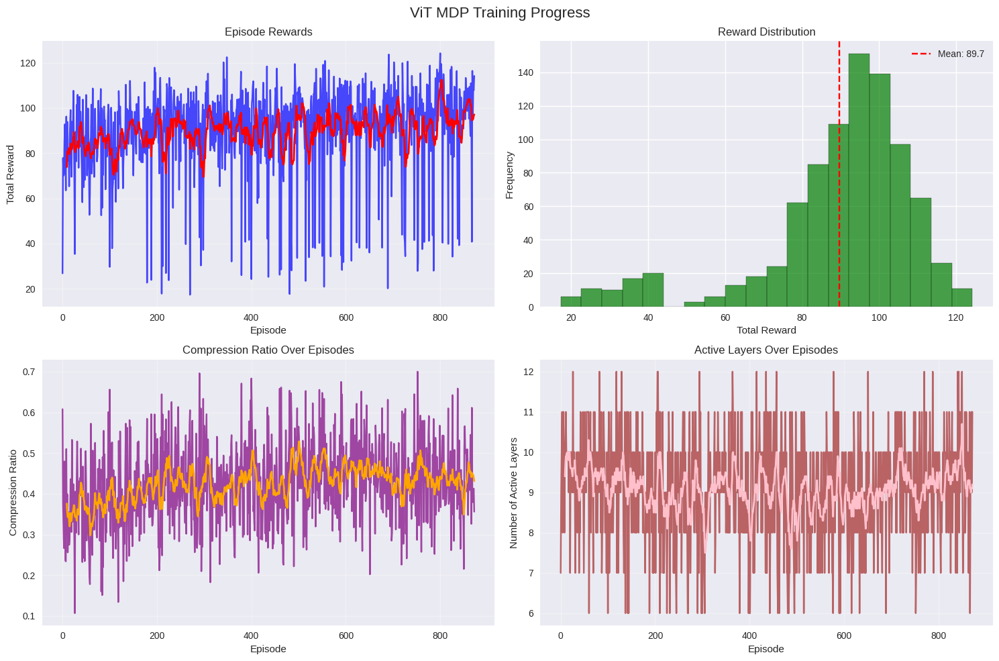

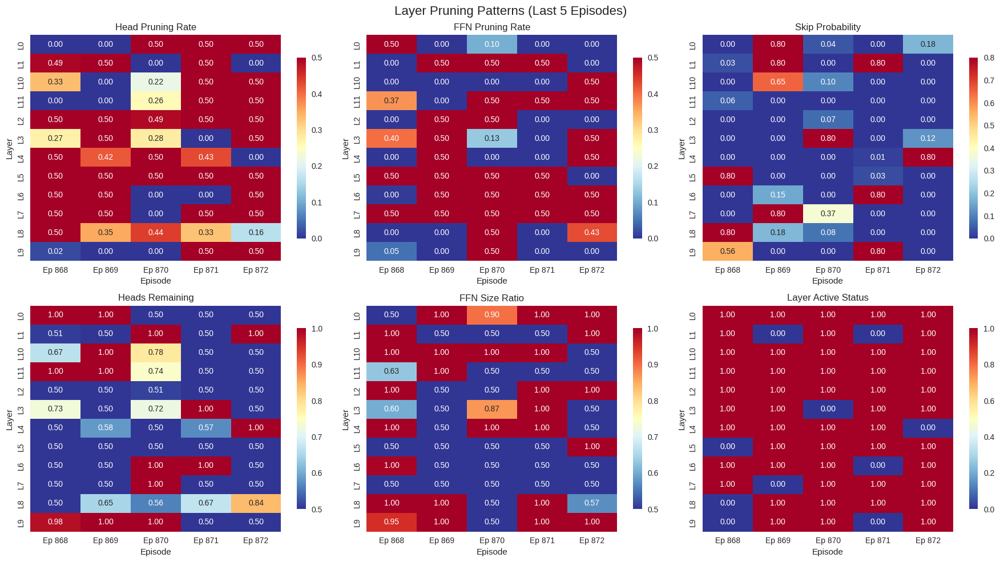

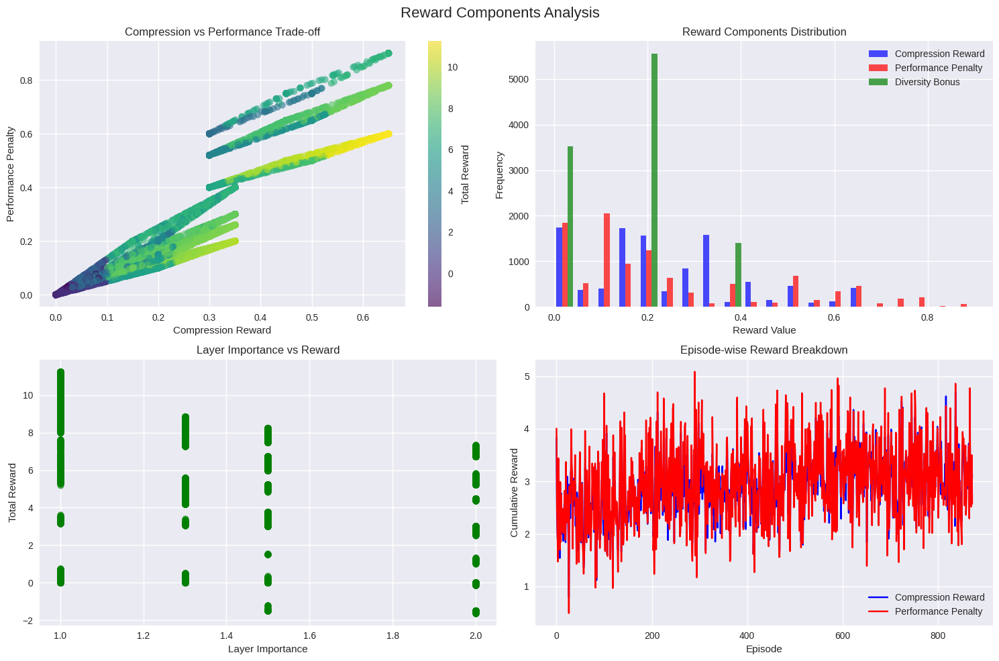

Detailed results saved to enhanced_vit_mdp_results.json


In [2]:
# import gym
# from gym import spaces
# import numpy as np
# from transformers import ViTConfig
# from stable_baselines3 import PPO
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# from collections import defaultdict
# import json

class ImprovedViTMDPEnvironment(gym.Env):
    """Improved ViT MDP environment with practical constraints and realistic rewards."""
    
    def __init__(self, model_name="google/vit-base-patch16-224", debug=True):
        super().__init__()
        self.debug = debug
        
        # Model configuration
        self.config = ViTConfig.from_pretrained(model_name)
        self.num_layers = self.config.num_hidden_layers
        self.num_heads = self.config.num_attention_heads
        
        # Practical constraints
        self.min_active_layers = max(3, int(self.num_layers * 0.25))  # At least 25% layers active
        self.min_heads_ratio = 0.3  # At least 30% heads must remain
        self.min_ffn_ratio = 0.2    # At least 20% FFN must remain
        self.max_skip_layers = int(self.num_layers * 0.5)  # Max 50% layers can be skipped
        
        # Spaces
        self.observation_space = spaces.Box(
            low=0.0, high=1.0, shape=(6,), dtype=np.float32  # Extended state space
        )
        self.action_space = spaces.Box(
            low=np.array([0.0, 0.0, 0.0], dtype=np.float32),
            high=np.array([0.5, 0.5, 0.8], dtype=np.float32),  # Reduced action bounds
            dtype=np.float32
        )
        
        # Tracking variables
        self.episode_transitions = []
        self.episode_rewards = []
        self.all_episodes_data = []
        self.episode_count = 0
        
        self.reset()

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        # Reset episode state
        self.current_layer = 0
        self.total_reward = 0.0
        self.episode_transitions = []
        self.skipped_layers_count = 0
        
        # Initialize layer states
        self.layer_states = [
            {
                'heads_remaining': 1.0,
                'ffn_size_ratio': 1.0,
                'is_active': True,
                'original_heads': self.num_heads,
                'original_ffn_size': 3072
            } for _ in range(self.num_layers)
        ]
        
        initial_state = self._get_current_state()
        return initial_state, {}

    def _get_current_state(self):
        """Get enhanced state representation with more information."""
        progress = self.current_layer / self.num_layers
        avg_heads = np.mean([ls['heads_remaining'] for ls in self.layer_states])
        avg_ffn = np.mean([ls['ffn_size_ratio'] for ls in self.layer_states])
        active_ratio = sum(ls['is_active'] for ls in self.layer_states) / self.num_layers
        
        # Additional state features
        remaining_skip_budget = max(0, (self.max_skip_layers - self.skipped_layers_count) / self.num_layers)
        compression_so_far = self._calculate_compression_ratio()
        
        return np.array([
            progress, avg_heads, avg_ffn, active_ratio, 
            remaining_skip_budget, compression_so_far
        ], dtype=np.float32)

    def step(self, action):
        head_ratio, ffn_ratio, skip_prob = map(float, action)
        
        # Store previous state for transition tracking
        prev_state = self._get_current_state().copy()
        
        if self.debug:
            print("\\n[Step] Layer {} | Action: heads={:.2f}, ffn={:.2f}, skip_prob={:.2f}".format(
                self.current_layer, head_ratio, ffn_ratio, skip_prob))
        
        # Apply constraints and action
        reward_components = self._apply_constrained_action(
            self.current_layer, head_ratio, ffn_ratio, skip_prob
        )
        
        step_reward = reward_components['total_reward']
        self.total_reward += step_reward
        
        # Get new state after action
        new_state = self._get_current_state()
        
        # Store transition information
        transition_info = {
            'layer': self.current_layer,
            'prev_state': prev_state,
            'action': [head_ratio, ffn_ratio, skip_prob],
            'new_state': new_state,
            'reward_components': reward_components,
            'layer_state_after': self.layer_states[self.current_layer].copy(),
            'constraints_violated': reward_components.get('constraints_violated', [])
        }
        self.episode_transitions.append(transition_info)
        
        if self.debug:
            self._print_transition_details(transition_info)
        
        # Move to next layer
        self.current_layer += 1
        terminated = self.current_layer >= self.num_layers
        
        # Calculate final bonus if episode ended
        if terminated:
            final_bonus = self._calculate_realistic_final_bonus()
            step_reward += final_bonus
            self.total_reward += final_bonus
            
            # Store episode data
            episode_data = {
                'episode': self.episode_count,
                'total_reward': self.total_reward,
                'final_bonus': final_bonus,
                'compression_ratio': self._calculate_compression_ratio(),
                'active_layers': sum(ls['is_active'] for ls in self.layer_states),
                'transitions': self.episode_transitions.copy(),
                'is_valid_model': self._is_valid_model()
            }
            self.all_episodes_data.append(episode_data)
            self.episode_rewards.append(self.total_reward)
            self.episode_count += 1
            
            if self.debug:
                print("[Episode End] Total Reward: {:.2f}, Final Bonus: {:.2f}".format(self.total_reward, final_bonus))
                print("Compression Ratio: {:.2%}".format(self._calculate_compression_ratio()))
                print("Valid Model: {}".format(self._is_valid_model()))

        next_state = self._get_current_state()
        info = {
            'layer': self.current_layer - 1,
            'total_reward': self.total_reward,
            'compression_ratio': self._calculate_compression_ratio(),
            'active_layers': sum(ls['is_active'] for ls in self.layer_states),
            'is_valid': self._is_valid_model(),
            'transition_info': transition_info if not terminated else None
        }
        
        return next_state, step_reward, terminated, False, info

    def _apply_constrained_action(self, idx, head_prune, ffn_prune, skip_prob):
        """Apply action with practical constraints."""
        if idx >= len(self.layer_states):
            return {'total_reward': 0.0, 'compression_reward': 0.0, 'performance_penalty': 0.0}
        
        state = self.layer_states[idx]
        prev_heads = state['heads_remaining']
        prev_ffn = state['ffn_size_ratio']
        constraints_violated = []
        
        # Apply skip constraint
        will_skip = skip_prob > 0.5 and self.skipped_layers_count < self.max_skip_layers
        
        # Critical layer protection (first, last 2 layers should remain active)
        is_critical_layer = idx in [0, self.num_layers-2, self.num_layers-1]
        if is_critical_layer:
            will_skip = False
            if skip_prob > 0.5:
                constraints_violated.append("Critical layer {} skip prevented".format(idx))
        
        # Apply pruning with minimum constraints
        new_heads = max(self.min_heads_ratio, prev_heads * (1 - head_prune))
        new_ffn = max(self.min_ffn_ratio, prev_ffn * (1 - ffn_prune))
        
        # Check if pruning was constrained
        if new_heads == self.min_heads_ratio and prev_heads * (1 - head_prune) < self.min_heads_ratio:
            constraints_violated.append("Heads pruning limited to maintain minimum ratio")
        if new_ffn == self.min_ffn_ratio and prev_ffn * (1 - ffn_prune) < self.min_ffn_ratio:
            constraints_violated.append("FFN pruning limited to maintain minimum ratio")
        
        # Update layer state
        state['heads_remaining'] = new_heads
        state['ffn_size_ratio'] = new_ffn
        
        if will_skip:
            state['is_active'] = False
            self.skipped_layers_count += 1
        
        if self.debug:
            print("  → heads_remaining: {:.2f}, ffn_size_ratio: {:.2f}, is_active: {}".format(
                state['heads_remaining'], state['ffn_size_ratio'], state['is_active']))
            if constraints_violated:
                for constraint in constraints_violated:
                    print("  ⚠️  {}".format(constraint))
        
        # Calculate reward with constraint penalties
        reward_components = self._calculate_realistic_reward(
            idx, head_prune, ffn_prune, skip_prob, prev_heads, prev_ffn, 
            state['is_active'], constraints_violated
        )
        reward_components['constraints_violated'] = constraints_violated
        
        return reward_components

    def _calculate_realistic_reward(self, idx, head_prune, ffn_prune, skip_prob, 
                                  prev_heads, prev_ffn, active, constraints_violated):
        """Calculate realistic reward with balanced objectives."""
        
        # Actual compression achieved (not intended)
        actual_head_prune = prev_heads - max(self.min_heads_ratio, prev_heads * (1 - head_prune))
        actual_ffn_prune = prev_ffn - max(self.min_ffn_ratio, prev_ffn * (1 - ffn_prune))
        actual_skip = 1.0 if not active else 0.0
        
        # Compression rewards (more balanced weights)
        compression_reward = (actual_head_prune * 0.3 + 
                            actual_ffn_prune * 0.4 + 
                            actual_skip * 0.3)  # Reduced skip reward
        
        # Performance preservation (layer importance) - Reduced penalties
        importance = self._realistic_layer_importance(idx)
        performance_penalty = (actual_head_prune * 0.2 * importance +  # Reduced from 0.4
                             actual_ffn_prune * 0.2 * importance +    # Reduced from 0.3  
                             actual_skip * 0.4 * importance)          # Reduced from 0.8
        
        # Model functionality penalty
        functionality_penalty = 0.0
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        if active_count < self.min_active_layers:
            functionality_penalty = 2.0  # Strong penalty
        
        # Constraint violation penalty
        constraint_penalty = len(constraints_violated) * 0.1
        
        # Efficiency bonus (reward moderate compression) - More generous
        efficiency_bonus = 0.0
        total_compression = compression_reward
        if 0.1 <= total_compression <= 0.8:  # Wider sweet spot
            efficiency_bonus = 0.3
        
        # Diversity bonus (encourage different strategies)
        diversity_bonus = 0.0
        if actual_head_prune > 0.1:  # Reward head pruning usage
            diversity_bonus += 0.2
        if actual_skip > 0:  # Reward skip usage
            diversity_bonus += 0.2
        
        # Calculate total reward (increased multiplier for stronger signals)
        raw_reward = (compression_reward - performance_penalty - 
                     functionality_penalty - constraint_penalty + 
                     efficiency_bonus + diversity_bonus)
        total_reward = 15.0 * raw_reward  # Increased from 10.0
        
        return {
            'total_reward': total_reward,
            'compression_reward': compression_reward,
            'performance_penalty': performance_penalty,
            'functionality_penalty': functionality_penalty,
            'constraint_penalty': constraint_penalty,
            'efficiency_bonus': efficiency_bonus,
            'diversity_bonus': diversity_bonus,
            'actual_head_prune': actual_head_prune,
            'actual_ffn_prune': actual_ffn_prune,
            'actual_skip': actual_skip,
            'layer_importance': importance,
            'raw_reward': raw_reward
        }

    def _realistic_layer_importance(self, idx):
        """More nuanced layer importance calculation."""
        pos = idx / (self.num_layers - 1)
        
        # First and last layers are most critical
        if idx == 0 or idx == self.num_layers - 1:
            return 2.0
        elif idx == 1 or idx == self.num_layers - 2:
            return 1.5
        elif pos < 0.3 or pos > 0.7:  # Early/late layers
            return 1.3
        else:  # Middle layers
            return 1.0

    def _calculate_realistic_final_bonus(self):
        """Calculate realistic final bonus with model validity check."""
        if not self._is_valid_model():
            return -50.0  # Strong penalty for invalid models
        
        comp_ratio = self._calculate_compression_ratio()
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        
        # Reward moderate compression more than extreme compression
        if 0.2 <= comp_ratio <= 0.6:
            compression_bonus = comp_ratio * 40.0  # Reduced from 60.0
        elif comp_ratio > 0.6:
            compression_bonus = 40.0 * 0.6 - (comp_ratio - 0.6) * 20.0  # Diminishing returns
        else:
            compression_bonus = comp_ratio * 40.0
        
        # Stability bonus for maintaining reasonable number of active layers
        stability_bonus = 0.0
        if active_count >= self.min_active_layers:
            stability_bonus = 10.0
        
        return compression_bonus + stability_bonus

    def _is_valid_model(self):
        """Check if the resulting model is practically valid."""
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        
        # Must have minimum active layers
        if active_count < self.min_active_layers:
            return False
        
        # First layer must be active (feature extraction)
        if not self.layer_states[0]['is_active']:
            return False
        
        # Last layer must be active (classification)
        if not self.layer_states[-1]['is_active']:
            return False
        
        # Must have reasonable total capacity
        total_capacity = sum(
            ls['heads_remaining'] * ls['ffn_size_ratio'] 
            for ls in self.layer_states if ls['is_active']
        )
        min_required_capacity = len(self.layer_states) * 0.3
        
        return total_capacity >= min_required_capacity

    def _print_transition_details(self, transition_info):
        """Print detailed transition information."""
        layer = transition_info['layer']
        prev_state = transition_info['prev_state']
        action = transition_info['action']
        new_state = transition_info['new_state']
        reward_comp = transition_info['reward_components']
        constraints = transition_info['constraints_violated']
        
        print("  State Transition:")
        print("    Before: progress={:.3f}, avg_heads={:.3f}, avg_ffn={:.3f}, active_ratio={:.3f}".format(
            prev_state[0], prev_state[1], prev_state[2], prev_state[3]))
        print("    After:  progress={:.3f}, avg_heads={:.3f}, avg_ffn={:.3f}, active_ratio={:.3f}".format(
            new_state[0], new_state[1], new_state[2], new_state[3]))
        print("  Reward Breakdown:")
        print("    Compression: {:.3f}".format(reward_comp['compression_reward']))
        print("    Performance Penalty: {:.3f}".format(reward_comp['performance_penalty']))
        print("    Functionality Penalty: {:.3f}".format(reward_comp['functionality_penalty']))
        print("    Efficiency Bonus: {:.3f}".format(reward_comp['efficiency_bonus']))
        print("    Diversity Bonus: {:.3f}".format(reward_comp['diversity_bonus']))
        print("    Total: {:.3f}".format(reward_comp['total_reward']))
        
        if constraints:
            print("  Constraints: {} violations".format(len(constraints)))

    def _calculate_compression_ratio(self):
        """Calculate overall compression ratio."""
        total_orig = total_curr = 0.0
        
        for ls in self.layer_states:
            # Original parameters
            head_orig = ls['original_heads'] * 64 * 768
            ffn_orig = ls['original_ffn_size'] * 768
            total_orig += head_orig + ffn_orig
            
            # Current parameters (only count if active)
            if ls['is_active']:
                head_curr = ls['original_heads'] * ls['heads_remaining'] * 64 * 768
                ffn_curr = ls['original_ffn_size'] * ls['ffn_size_ratio'] * 768
                total_curr += head_curr + ffn_curr
        
        return max(0.0, min(1.0, 1.0 - (total_curr / total_orig)))

    def get_episode_data(self):
        """Return all collected episode data."""
        return self.all_episodes_data

    def get_reward_history(self):
        """Return episode reward history."""
        return self.episode_rewards

    def get_valid_episodes(self):
        """Return only episodes that resulted in valid models."""
        return [ep for ep in self.all_episodes_data if ep['is_valid_model']]


class ViTMDPVisualizer:
    """Visualization tools for ViT MDP training results."""
    
    def __init__(self, env):
        self.env = env
        plt.style.use('seaborn-v0_8')
        
    def plot_training_progress(self, save_path=None):
        """Plot training progress over episodes."""
        rewards = self.env.get_reward_history()
        
        if len(rewards) == 0:
            print("No training data available for plotting.")
            return
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle('ViT MDP Training Progress', fontsize=16)
        
        # Episode rewards
        axes[0,0].plot(rewards, alpha=0.7, color='blue')
        axes[0,0].plot(pd.Series(rewards).rolling(10).mean(), color='red', linewidth=2)
        axes[0,0].set_title('Episode Rewards')
        axes[0,0].set_xlabel('Episode')
        axes[0,0].set_ylabel('Total Reward')
        axes[0,0].grid(True, alpha=0.3)
        
        # Reward distribution
        axes[0,1].hist(rewards, bins=20, alpha=0.7, color='green', edgecolor='black')
        axes[0,1].axvline(np.mean(rewards), color='red', linestyle='--', 
                         label='Mean: {:.1f}'.format(np.mean(rewards)))
        axes[0,1].set_title('Reward Distribution')
        axes[0,1].set_xlabel('Total Reward')
        axes[0,1].set_ylabel('Frequency')
        axes[0,1].legend()
        
        # Compression ratio over episodes
        episode_data = self.env.get_episode_data()
        if episode_data:
            comp_ratios = [ep['compression_ratio'] for ep in episode_data]
            axes[1,0].plot(comp_ratios, alpha=0.7, color='purple')
            axes[1,0].plot(pd.Series(comp_ratios).rolling(10).mean(), color='orange', linewidth=2)
            axes[1,0].set_title('Compression Ratio Over Episodes')
            axes[1,0].set_xlabel('Episode')
            axes[1,0].set_ylabel('Compression Ratio')
            axes[1,0].grid(True, alpha=0.3)
            
            # Active layers over episodes
            active_layers = [ep['active_layers'] for ep in episode_data]
            axes[1,1].plot(active_layers, alpha=0.7, color='brown')
            axes[1,1].plot(pd.Series(active_layers).rolling(10).mean(), color='pink', linewidth=2)
            axes[1,1].set_title('Active Layers Over Episodes')
            axes[1,1].set_xlabel('Episode')
            axes[1,1].set_ylabel('Number of Active Layers')
            axes[1,1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    def plot_layer_pruning_patterns(self, num_episodes=5, save_path=None):
        """Plot pruning patterns across layers for recent episodes."""
        episode_data = self.env.get_episode_data()
        
        if len(episode_data) < num_episodes:
            print("Only {} episodes available.".format(len(episode_data)))
            num_episodes = len(episode_data)
        
        # Get data from last few episodes
        recent_episodes = episode_data[-num_episodes:]
        
        # Create data for heatmap
        layer_data = defaultdict(list)
        
        for ep in recent_episodes:
            for transition in ep['transitions']:
                layer = transition['layer']
                action = transition['action']
                layer_state = transition['layer_state_after']
                
                layer_data['Episode'].append("Ep {}".format(ep['episode']))
                layer_data['Layer'].append("L{}".format(layer))
                layer_data['Head_Prune'].append(action[0])
                layer_data['FFN_Prune'].append(action[1])
                layer_data['Skip_Prob'].append(action[2])
                layer_data['Heads_Remaining'].append(layer_state['heads_remaining'])
                layer_data['FFN_Ratio'].append(layer_state['ffn_size_ratio'])
                layer_data['Is_Active'].append(1.0 if layer_state['is_active'] else 0.0)
        
        df = pd.DataFrame(layer_data)
        
        # Create subplots
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        fig.suptitle('Layer Pruning Patterns (Last {} Episodes)'.format(num_episodes), fontsize=16)
        
        # Pivot tables for heatmaps
        metrics = ['Head_Prune', 'FFN_Prune', 'Skip_Prob', 'Heads_Remaining', 'FFN_Ratio', 'Is_Active']
        titles = ['Head Pruning Rate', 'FFN Pruning Rate', 'Skip Probability', 
                 'Heads Remaining', 'FFN Size Ratio', 'Layer Active Status']
        
        for i, (metric, title) in enumerate(zip(metrics, titles)):
            row, col = i // 3, i % 3
            
            # Create pivot table
            pivot_data = df.pivot_table(values=metric, index='Layer', columns='Episode', aggfunc='mean')
            
            # Create heatmap
            sns.heatmap(pivot_data, annot=True, fmt='.2f', cmap='RdYlBu_r', 
                       ax=axes[row, col], cbar_kws={'shrink': 0.8})
            axes[row, col].set_title(title)
            axes[row, col].set_xlabel('Episode')
            axes[row, col].set_ylabel('Layer')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    def plot_reward_components_analysis(self, save_path=None):
        """Analyze reward components across episodes."""
        episode_data = self.env.get_episode_data()
        
        if not episode_data:
            print("No episode data available.")
            return
        
        # Collect reward component data
        comp_rewards = []
        perf_penalties = []
        total_rewards = []
        layer_importances = []
        diversity_bonuses = []
        
        for ep in episode_data:
            for transition in ep['transitions']:
                reward_comp = transition['reward_components']
                comp_rewards.append(reward_comp['compression_reward'])
                perf_penalties.append(reward_comp['performance_penalty'])
                total_rewards.append(reward_comp['total_reward'])
                layer_importances.append(reward_comp['layer_importance'])
                if 'diversity_bonus' in reward_comp:
                    diversity_bonuses.append(reward_comp['diversity_bonus'])
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle('Reward Components Analysis', fontsize=16)
        
        # Compression vs Performance scatter
        scatter = axes[0,0].scatter(comp_rewards, perf_penalties, alpha=0.6, c=total_rewards, cmap='viridis')
        axes[0,0].set_xlabel('Compression Reward')
        axes[0,0].set_ylabel('Performance Penalty')
        axes[0,0].set_title('Compression vs Performance Trade-off')
        colorbar = plt.colorbar(scatter, ax=axes[0,0])
        colorbar.set_label('Total Reward')
        
        # Reward components distribution
        reward_data = [comp_rewards, perf_penalties]
        reward_labels = ['Compression Reward', 'Performance Penalty']
        colors = ['blue', 'red']
        
        if diversity_bonuses:
            reward_data.append(diversity_bonuses)
            reward_labels.append('Diversity Bonus')
            colors.append('green')
        
        axes[0,1].hist(reward_data, bins=20, alpha=0.7, label=reward_labels, color=colors)
        axes[0,1].set_xlabel('Reward Value')
        axes[0,1].set_ylabel('Frequency')
        axes[0,1].set_title('Reward Components Distribution')
        axes[0,1].legend()
        
        # Layer importance impact
        axes[1,0].scatter(layer_importances, total_rewards, alpha=0.6, color='green')
        axes[1,0].set_xlabel('Layer Importance')
        axes[1,0].set_ylabel('Total Reward')
        axes[1,0].set_title('Layer Importance vs Reward')
        
        # Episode-wise reward breakdown
        episode_comp_rewards = []
        episode_penalties = []
        
        for ep in episode_data:
            ep_comp = sum(t['reward_components']['compression_reward'] for t in ep['transitions'])
            ep_penalty = sum(t['reward_components']['performance_penalty'] for t in ep['transitions'])
            episode_comp_rewards.append(ep_comp)
            episode_penalties.append(ep_penalty)
        
        episodes = range(len(episode_data))
        axes[1,1].plot(episodes, episode_comp_rewards, label='Compression Reward', color='blue')
        axes[1,1].plot(episodes, episode_penalties, label='Performance Penalty', color='red')
        axes[1,1].set_xlabel('Episode')
        axes[1,1].set_ylabel('Cumulative Reward')
        axes[1,1].set_title('Episode-wise Reward Breakdown')
        axes[1,1].legend()
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

    def save_detailed_results(self, filepath='vit_mdp_results.json'):
        """Save detailed results to JSON file."""
        episode_data = self.env.get_episode_data()
        
    def save_detailed_results(self, filepath='vit_mdp_results.json'):
        """Save detailed results to JSON file."""
        episode_data = self.env.get_episode_data()
        
        # Convert numpy arrays to lists for JSON serialization
        def convert_numpy(obj):
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            elif isinstance(obj, np.float32):
                return float(obj)
            return obj
        
        # Process data for JSON
        json_data = []
        for ep in episode_data:
            ep_data = ep.copy()
            
            # Convert transitions
            for transition in ep_data['transitions']:
                transition['prev_state'] = convert_numpy(transition['prev_state'])
                transition['new_state'] = convert_numpy(transition['new_state'])
                transition['action'] = convert_numpy(transition['action'])
            
            json_data.append(ep_data)
        
        with open(filepath, 'w') as f:
            json.dump(json_data, f, indent=2, default=convert_numpy)
        
        print("Detailed results saved to {}".format(filepath))


class ExplorationEnhancedEnvironment(ImprovedViTMDPEnvironment):
    """Environment with enhanced exploration mechanisms."""
    
    def __init__(self, model_name="google/vit-base-patch16-224", debug=True):
        self.exploration_bonus_decay = 0.95
        self.current_exploration_bonus = 1.0
        self.action_history = []
        super().__init__(model_name=model_name, debug=debug)

    
    def step(self, action):
        # Add exploration noise to actions
        if np.random.random() < 0.2:  # 20% chance of exploration
            noise = np.random.normal(0, 0.1, size=action.shape)
            action = np.clip(action + noise, self.action_space.low, self.action_space.high)
        
        # Store action for diversity tracking
        self.action_history.append(action.copy())
        
        # Call parent step method
        next_state, reward, terminated, truncated, info = super().step(action)
        
        # Add exploration bonus
        if len(self.action_history) > 1:
            # Reward action diversity
            last_action = self.action_history[-1]
            prev_action = self.action_history[-2]
            action_diff = np.linalg.norm(last_action - prev_action)
            exploration_reward = action_diff * self.current_exploration_bonus * 2.0
            reward += exploration_reward
        
        return next_state, reward, terminated, truncated, info
    
    def reset(self, **kwargs):
        self.action_history = []
        self.current_exploration_bonus *= self.exploration_bonus_decay
        return super().reset(**kwargs)


def train_improved_agent():
    """Train agent with improved environment."""
    print("Initializing Improved ViT MDP Environment...")
    env = ImprovedViTMDPEnvironment(debug=True)
    visualizer = ViTMDPVisualizer(env)
    
    print("Training PPO Agent with improved settings...")
    model = PPO(
        "MlpPolicy", 
        env, 
        verbose=1, 
        n_steps=2048,        # Increased for more exploration
        batch_size=128,      # Larger batch size
        n_epochs=15,         # More update epochs
        learning_rate=5e-4,  # Increased learning rate
        ent_coef=0.3,        # Increased entropy for more exploration
        clip_range=0.3,      # Increased clip range
        gamma=0.98,          # Slightly reduced discount factor
        gae_lambda=0.95
    )
    
    # Train the model with more timesteps
    model.learn(total_timesteps=8000)  # Increased from 5000
    
    print("\\nRunning evaluation episodes...")
    # Run evaluation episodes
    for ep in range(15):  # More evaluation episodes
        obs, _ = env.reset()
        done = False
        total_reward = 0
        
        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, reward, done, _, info = env.step(action)
            total_reward += reward
        
        valid_indicator = "✅" if info['is_valid'] else "❌"
        print("Episode {}: {} Reward={:.2f}, Compression={:.2%}, Active Layers={}/{}".format(
            ep+1, valid_indicator, info['total_reward'], info['compression_ratio'], 
            info['active_layers'], env.num_layers))
    
    # Print summary statistics
    valid_episodes = env.get_valid_episodes()
    print("\\n📊 Summary:")
    print("Valid Models: {}/{} ({:.1f}%)".format(
        len(valid_episodes), len(env.get_episode_data()), 
        len(valid_episodes)/len(env.get_episode_data())*100))
    
    if valid_episodes:
        avg_compression = np.mean([ep['compression_ratio'] for ep in valid_episodes])
        avg_active = np.mean([ep['active_layers'] for ep in valid_episodes])
        avg_reward = np.mean([ep['total_reward'] for ep in valid_episodes])
        
        print("Valid Models Average:")
        print("  - Compression: {:.2%}".format(avg_compression))
        print("  - Active Layers: {:.1f}/{}".format(avg_active, env.num_layers))
        print("  - Reward: {:.2f}".format(avg_reward))
    
    # Generate visualizations
    print("\\nGenerating visualizations...")
    visualizer.plot_training_progress(save_path='improved_training_progress.png')
    visualizer.plot_layer_pruning_patterns(num_episodes=5, save_path='improved_pruning_patterns.png')
    visualizer.plot_reward_components_analysis(save_path='improved_reward_analysis.png')
    visualizer.save_detailed_results('improved_vit_mdp_results.json')
    
    print("\\nTraining completed! Check the generated plots and JSON file for detailed results.")
    
    return model, env, visualizer


def train_exploration_enhanced_agent():
    """Train agent with exploration-enhanced environment."""
    print("Initializing Exploration-Enhanced ViT MDP Environment...")
    env = ExplorationEnhancedEnvironment(debug=True)
    visualizer = ViTMDPVisualizer(env)
    
    print("Training PPO Agent with exploration enhancement...")
    model = PPO(
        "MlpPolicy", 
        env, 
        verbose=1, 
        n_steps=2048,
        batch_size=128,
        n_epochs=15,
        learning_rate=5e-4,
        ent_coef=0.4,        # Even higher entropy
        clip_range=0.3,
        gamma=0.98,
        gae_lambda=0.95,
        policy_kwargs=dict(
            net_arch=[256, 256, 128]  # Larger network for more capacity
        )
    )
    
    # Train the model
    model.learn(total_timesteps=10000)
    
    print("\\nRunning evaluation episodes...")
    results = []
    
    for ep in range(20):
        obs, _ = env.reset()
        done = False
        episode_actions = []
        
        while not done:
            action, _ = model.predict(obs, deterministic=False)  # Non-deterministic for variety
            episode_actions.append(action.copy())
            obs, reward, done, _, info = env.step(action)
        
        valid_indicator = "✅" if info['is_valid'] else "❌"
        results.append({
            'episode': ep + 1,
            'valid': info['is_valid'],
            'reward': info['total_reward'],
            'compression': info['compression_ratio'], 
            'active_layers': info['active_layers'],
            'actions': episode_actions
        })
        
        print("Episode {}: {} Reward={:.2f}, Compression={:.2%}, Active Layers={}/{}".format(
            ep+1, valid_indicator, info['total_reward'], info['compression_ratio'],
            info['active_layers'], env.num_layers))
    
    # Analyze diversity
    print("\\n🔍 Diversity Analysis:")
    valid_results = [r for r in results if r['valid']]
    
    if len(valid_results) > 1:
        # Calculate action diversity
        all_actions = []
        for result in valid_results:
            flat_actions = np.concatenate(result['actions'])
            all_actions.append(flat_actions)
        
        action_std = np.std(all_actions, axis=0)
        diversity_score = np.mean(action_std)
        
        compression_std = np.std([r['compression'] for r in valid_results])
        reward_std = np.std([r['reward'] for r in valid_results])
        
        print("Action Diversity Score: {:.4f}".format(diversity_score))
        print("Compression Std: {:.4f}".format(compression_std))
        print("Reward Std: {:.4f}".format(reward_std))
        
        unique_active_layers = len(set(r['active_layers'] for r in valid_results))
        print("Unique Active Layer Counts: {}".format(unique_active_layers))
    
    # Print summary statistics
    valid_episodes = [r for r in results if r['valid']]
    print("\\n📊 Enhanced Summary:")
    print("Valid Models: {}/{} ({:.1f}%)".format(
        len(valid_episodes), len(results), len(valid_episodes)/len(results)*100))
    
    if valid_episodes:
        compressions = [r['compression'] for r in valid_episodes]
        rewards = [r['reward'] for r in valid_episodes]
        active_layers = [r['active_layers'] for r in valid_episodes]
        
        print("Valid Models Statistics:")
        print("  - Compression: {:.2%} (±{:.2%})".format(
            np.mean(compressions), np.std(compressions)))
        print("  - Active Layers: {:.1f} (±{:.1f})".format(
            np.mean(active_layers), np.std(active_layers)))
        print("  - Reward: {:.2f} (±{:.2f})".format(
            np.mean(rewards), np.std(rewards)))
        print("  - Range: Compression {:.1%}-{:.1%}, Layers {}-{}".format(
            min(compressions), max(compressions), min(active_layers), max(active_layers)))
    
    # Generate visualizations
    print("\\nGenerating visualizations...")
    visualizer.plot_training_progress(save_path='enhanced_training_progress.png')
    visualizer.plot_layer_pruning_patterns(num_episodes=5, save_path='enhanced_pruning_patterns.png')
    visualizer.plot_reward_components_analysis(save_path='enhanced_reward_analysis.png')
    visualizer.save_detailed_results('enhanced_vit_mdp_results.json')
    
    return model, env, results


if __name__ == "__main__":
    # Choose which training approach to use
    print("Choose training approach:")
    print("1. Standard improved training")
    print("2. Exploration-enhanced training")
    
    try:
        choice = input("Enter choice (1 or 2): ").strip()
    except:
        choice = "1"  # Default choice
    
    if choice == "2":
        model, env, results = train_exploration_enhanced_agent()
    else:
        model, env, visualizer = train_improved_agent()

### 4. state-action pair

🚀 Starting Conditional ViT Compression System

📋 Creating Rule Explanation Chart...


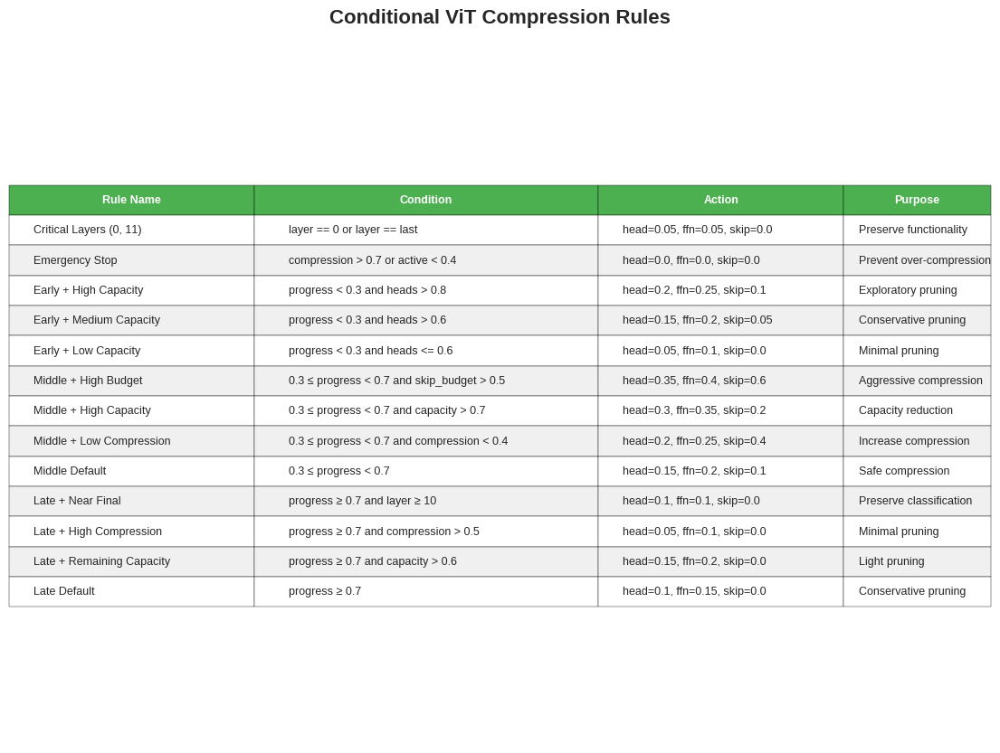

   - Rule explanation chart saved as 'conditional_rules_explanation.png'
🤖 Conditional Rule-Based ViT MDP Demonstration

🎯 Running Episodes with Conditional Rules...

📍 Episode 1
----------------------------------------
  🧠 Layer 0 Decision:
     State: progress=0.00, heads=1.00, ffn=1.00
     Action: head_prune=0.05, ffn_prune=0.05, skip_prob=0.00
     Reason: Critical layer 0: Minimal compression to preserve functionality
  🧠 Layer 1 Decision:
     State: progress=0.08, heads=1.00, ffn=1.00
     Action: head_prune=0.20, ffn_prune=0.25, skip_prob=0.10
     Reason: Early stage with high capacity: Exploratory pruning
  🧠 Layer 2 Decision:
     State: progress=0.17, heads=0.98, ffn=0.98
     Action: head_prune=0.20, ffn_prune=0.25, skip_prob=0.10
     Reason: Early stage with high capacity: Exploratory pruning
  🧠 Layer 3 Decision:
     State: progress=0.25, heads=0.96, ffn=0.95
     Action: head_prune=0.20, ffn_prune=0.25, skip_prob=0.10
     Reason: Early stage with high capacity: Expl

AttributeError: 'NoneType' object has no attribute 'get'

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import defaultdict, Counter
import json
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional
import gymnasium as gym
from gymnasium import spaces
from transformers import ViTConfig

# 기존 ImprovedViTMDPEnvironment 클래스는 그대로 사용한다고 가정
# 여기서는 새로운 조건부 규칙 기반 에이전트만 정의

class ConditionalViTAgent:
    """조건부 규칙 기반 ViT 압축 에이전트"""
    
    def __init__(self, num_layers: int = 12, debug: bool = True):
        self.num_layers = num_layers
        self.debug = debug
        self.decision_history = []  # 의사결정 기록
        self.action_stats = defaultdict(int)  # 액션 통계
        
    def decide_action(self, state: np.ndarray, layer_idx: int) -> Tuple[np.ndarray, str]:
        """조건부 규칙에 따른 액션 결정"""
        progress, avg_heads, avg_ffn, active_ratio, skip_budget, compression = state
        
        # 의사결정 과정 기록
        decision_log = {
            'layer': layer_idx,
            'state': state.copy(),
            'conditions_checked': [],
            'final_action': None,
            'reason': ""
        }
        
        # ===== 조건부 규칙 시작 =====
        
        # 1. 임계 레이어 보호 (첫 번째와 마지막 레이어)
        if layer_idx == 0 or layer_idx == self.num_layers - 1:
            action = np.array([0.05, 0.05, 0.0])  # 최소 압축
            reason = f"Critical layer {layer_idx}: Minimal compression to preserve functionality"
            decision_log['conditions_checked'].append("Critical layer protection")
            
        # 2. 응급 상황: 너무 많이 압축된 경우
        elif compression > 0.7 or active_ratio < 0.4:
            action = np.array([0.0, 0.0, 0.0])  # 압축 중단
            reason = f"Emergency stop: compression={compression:.2f}, active_ratio={active_ratio:.2f}"
            decision_log['conditions_checked'].append("Emergency protection")
            
        # 3. 초기 단계 (progress < 0.3)
        elif progress < 0.3:
            decision_log['conditions_checked'].append("Early stage")
            
            if avg_heads > 0.8 and avg_ffn > 0.8:
                # 용량이 충분한 초기 단계 - 탐색적 압축
                action = np.array([0.2, 0.25, 0.1])
                reason = "Early stage with high capacity: Exploratory pruning"
            elif avg_heads > 0.6 and avg_ffn > 0.6:
                # 중간 용량 - 보수적 압축
                action = np.array([0.15, 0.2, 0.05])
                reason = "Early stage with medium capacity: Conservative pruning"
            else:
                # 낮은 용량 - 매우 조심스럽게
                action = np.array([0.05, 0.1, 0.0])
                reason = "Early stage with low capacity: Minimal pruning"
                
        # 4. 중간 단계 (0.3 <= progress < 0.7) - 가장 공격적 압축 가능
        elif progress < 0.7:
            decision_log['conditions_checked'].append("Middle stage")
            
            # 스킵 예산과 현재 압축 상태 고려
            if skip_budget > 0.5 and active_ratio > 0.7:
                # 스킵 예산 충분하고 많은 레이어가 활성화됨
                if compression < 0.3:  # 아직 압축이 적음
                    action = np.array([0.35, 0.4, 0.6])  # 공격적 압축 + 스킵
                    reason = "Middle stage: Aggressive compression with layer skipping"
                else:
                    action = np.array([0.25, 0.3, 0.3])  # 중간 압축
                    reason = "Middle stage: Moderate compression"
            elif avg_heads > 0.7 or avg_ffn > 0.7:
                # 용량이 여전히 높음
                action = np.array([0.3, 0.35, 0.2])
                reason = "Middle stage: High capacity reduction"
            elif compression < 0.4:
                # 압축률이 아직 낮음
                action = np.array([0.2, 0.25, 0.4])
                reason = "Middle stage: Increase compression with skipping"
            else:
                # 안전한 중간 압축
                action = np.array([0.15, 0.2, 0.1])
                reason = "Middle stage: Safe moderate compression"
                
        # 5. 후기 단계 (progress >= 0.7) - 분류 성능 보호
        else:
            decision_log['conditions_checked'].append("Late stage")
            
            if layer_idx >= self.num_layers - 2:
                # 마지막 2개 레이어는 특별히 보호
                action = np.array([0.1, 0.1, 0.0])
                reason = f"Near-final layer {layer_idx}: Preserve classification capacity"
            elif compression > 0.5:
                # 이미 많이 압축됨
                action = np.array([0.05, 0.1, 0.0])
                reason = "Late stage with high compression: Minimal additional pruning"
            elif avg_heads > 0.6 and avg_ffn > 0.6:
                # 여전히 용량이 있음
                action = np.array([0.15, 0.2, 0.0])
                reason = "Late stage with remaining capacity: Light pruning"
            else:
                # 기본 후기 전략
                action = np.array([0.1, 0.15, 0.0])
                reason = "Late stage: Conservative pruning"
        
        # 액션 제한 적용 (환경의 제약 사항)
        action = np.clip(action, [0.0, 0.0, 0.0], [0.5, 0.5, 0.8])
        
        # 의사결정 기록 완성
        decision_log['final_action'] = action.copy()
        decision_log['reason'] = reason
        self.decision_history.append(decision_log)
        
        # 액션 통계 업데이트
        action_category = self._categorize_action(action)
        self.action_stats[action_category] += 1
        
        if self.debug:
            print(f"  🧠 Layer {layer_idx} Decision:")
            print(f"     State: progress={progress:.2f}, heads={avg_heads:.2f}, ffn={avg_ffn:.2f}")
            print(f"     Action: head_prune={action[0]:.2f}, ffn_prune={action[1]:.2f}, skip_prob={action[2]:.2f}")
            print(f"     Reason: {reason}")
        
        return action, reason
    
    def _categorize_action(self, action: np.ndarray) -> str:
        """액션을 카테고리로 분류"""
        head_prune, ffn_prune, skip_prob = action
        avg_compression = (head_prune + ffn_prune) / 2
        
        if skip_prob > 0.3:
            return "Skip-Heavy"
        elif avg_compression > 0.3:
            return "Aggressive"
        elif avg_compression > 0.15:
            return "Moderate" 
        elif avg_compression > 0.05:
            return "Conservative"
        else:
            return "Minimal"
    
    def get_decision_summary(self) -> Dict:
        """의사결정 요약 반환"""
        if not self.decision_history:
            return {"message": "No decisions recorded"}
        
        # 단계별 통계
        stage_stats = defaultdict(list)
        for decision in self.decision_history:
            progress = decision['state'][0]
            if progress < 0.3:
                stage = "Early"
            elif progress < 0.7:
                stage = "Middle"
            else:
                stage = "Late"
            stage_stats[stage].append(decision['final_action'])
        
        # 조건 사용 빈도
        condition_counts = Counter()
        for decision in self.decision_history:
            for condition in decision['conditions_checked']:
                condition_counts[condition] += 1
        
        return {
            "total_decisions": len(self.decision_history),
            "action_distribution": dict(self.action_stats),
            "condition_usage": dict(condition_counts),
            "stage_statistics": {
                stage: {
                    "count": len(actions),
                    "avg_head_prune": np.mean([a[0] for a in actions]),
                    "avg_ffn_prune": np.mean([a[1] for a in actions]),
                    "avg_skip_prob": np.mean([a[2] for a in actions])
                } for stage, actions in stage_stats.items()
            }
        }


class ConditionalViTMDPEnvironment:
    """조건부 규칙 기반 ViT MDP 환경"""
    
    def __init__(self, base_env, debug: bool = True):
        self.base_env = base_env
        self.agent = ConditionalViTAgent(base_env.num_layers, debug)
        self.episode_data = []
        self.debug = debug
    
    def run_episode(self) -> Dict:
        """한 에피소드 실행"""
        obs, _ = self.base_env.reset()
        done = False
        episode_decisions = []
        episode_rewards = []
        total_reward = 0
        
        while not done:
            # 조건부 규칙으로 액션 결정
            action, reason = self.agent.decide_action(obs, self.base_env.current_layer)
            
            # 환경에서 액션 실행
            next_obs, reward, done, _, info = self.base_env.step(action)
            
            # 결과 기록
            episode_decisions.append({
                'layer': self.base_env.current_layer - 1,
                'state': obs.copy(),
                'action': action.copy(),
                'reward': reward,
                'reason': reason,
                'layer_state': info.get('transition_info', {}).get('layer_state_after', {})
            })
            
            episode_rewards.append(reward)
            total_reward += reward
            obs = next_obs
        
        # 에피소드 결과
        episode_result = {
            'total_reward': info['total_reward'],
            'compression_ratio': info['compression_ratio'],
            'active_layers': info['active_layers'],
            'is_valid': info['is_valid'],
            'decisions': episode_decisions,
            'reward_trajectory': episode_rewards
        }
        
        self.episode_data.append(episode_result)
        return episode_result


class ConditionalViTVisualizer:
    """조건부 규칙 기반 결과 시각화"""
    
    def __init__(self, agent: ConditionalViTAgent, episode_data: List[Dict]):
        self.agent = agent
        self.episode_data = episode_data
        plt.style.use('seaborn-v0_8')
    
    def plot_decision_flow(self, episode_idx: int = -1, save_path: str = None):
        """의사결정 흐름 시각화"""
        if not self.episode_data:
            print("No episode data available")
            return
        
        episode = self.episode_data[episode_idx]
        decisions = episode['decisions']
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle(f'Decision Flow Analysis - Episode {len(self.episode_data) + episode_idx if episode_idx < 0 else episode_idx + 1}', fontsize=16)
        
        # 1. 레이어별 액션 결정
        layers = [d['layer'] for d in decisions]
        head_prunes = [d['action'][0] for d in decisions]
        ffn_prunes = [d['action'][1] for d in decisions]
        skip_probs = [d['action'][2] for d in decisions]
        
        axes[0,0].plot(layers, head_prunes, 'o-', label='Head Pruning', color='blue', linewidth=2, markersize=6)
        axes[0,0].plot(layers, ffn_prunes, 's-', label='FFN Pruning', color='red', linewidth=2, markersize=6)
        axes[0,0].plot(layers, skip_probs, '^-', label='Skip Probability', color='green', linewidth=2, markersize=6)
        axes[0,0].set_xlabel('Layer Index')
        axes[0,0].set_ylabel('Action Value')
        axes[0,0].set_title('Action Decisions by Layer')
        axes[0,0].legend()
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. 상태 변화
        progress_vals = [d['state'][0] for d in decisions]
        avg_heads_vals = [d['state'][1] for d in decisions]
        compression_vals = [d['state'][5] for d in decisions]
        
        axes[0,1].plot(layers, progress_vals, 'o-', label='Progress', color='purple', linewidth=2)
        axes[0,1].plot(layers, avg_heads_vals, 's-', label='Avg Heads', color='orange', linewidth=2)
        axes[0,1].plot(layers, compression_vals, '^-', label='Compression', color='brown', linewidth=2)
        axes[0,1].set_xlabel('Layer Index')
        axes[0,1].set_ylabel('State Value')
        axes[0,1].set_title('State Evolution')
        axes[0,1].legend()
        axes[0,1].grid(True, alpha=0.3)
        
        # 3. 보상 누적
        rewards = episode['reward_trajectory']
        cumulative_rewards = np.cumsum(rewards)
        
        axes[1,0].bar(layers, rewards, alpha=0.7, color='lightblue', edgecolor='navy')
        axes[1,0].plot(layers, np.array(rewards).cumsum(), 'ro-', linewidth=2, markersize=4)
        axes[1,0].set_xlabel('Layer Index')
        axes[1,0].set_ylabel('Reward')
        axes[1,0].set_title('Reward per Layer (Bars) & Cumulative (Line)')
        axes[1,0].grid(True, alpha=0.3)
        
        # 4. 의사결정 이유 분석
        reasons = [d['reason'] for d in decisions]
        reason_categories = []
        for reason in reasons:
            if "Critical" in reason:
                reason_categories.append("Critical")
            elif "Early" in reason:
                reason_categories.append("Early")
            elif "Middle" in reason:
                reason_categories.append("Middle")
            elif "Late" in reason:
                reason_categories.append("Late")
            elif "Emergency" in reason:
                reason_categories.append("Emergency")
            else:
                reason_categories.append("Other")
        
        reason_counts = Counter(reason_categories)
        colors = plt.cm.Set3(np.linspace(0, 1, len(reason_counts)))
        
        wedges, texts, autotexts = axes[1,1].pie(reason_counts.values(), labels=reason_counts.keys(), 
                                               autopct='%1.1f%%', colors=colors, startangle=90)
        axes[1,1].set_title('Decision Reason Distribution')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    def plot_action_patterns(self, save_path: str = None):
        """액션 패턴 분석"""
        if not self.episode_data:
            print("No episode data available")
            return
        
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Action Pattern Analysis Across Episodes', fontsize=16)
        
        # 모든 에피소드의 결정 수집
        all_decisions = []
        for episode in self.episode_data:
            all_decisions.extend(episode['decisions'])
        
        if not all_decisions:
            print("No decisions to analyze")
            return
        
        # 1. 레이어별 평균 액션
        layer_actions = defaultdict(lambda: {'head': [], 'ffn': [], 'skip': []})
        for decision in all_decisions:
            layer = decision['layer']
            layer_actions[layer]['head'].append(decision['action'][0])
            layer_actions[layer]['ffn'].append(decision['action'][1])
            layer_actions[layer]['skip'].append(decision['action'][2])
        
        layers = sorted(layer_actions.keys())
        avg_head = [np.mean(layer_actions[l]['head']) for l in layers]
        avg_ffn = [np.mean(layer_actions[l]['ffn']) for l in layers]
        avg_skip = [np.mean(layer_actions[l]['skip']) for l in layers]
        
        axes[0,0].plot(layers, avg_head, 'o-', label='Head Pruning', linewidth=2, markersize=6)
        axes[0,0].plot(layers, avg_ffn, 's-', label='FFN Pruning', linewidth=2, markersize=6)
        axes[0,0].plot(layers, avg_skip, '^-', label='Skip Probability', linewidth=2, markersize=6)
        axes[0,0].set_xlabel('Layer Index')
        axes[0,0].set_ylabel('Average Action Value')
        axes[0,0].set_title('Average Actions by Layer Position')
        axes[0,0].legend()
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. 액션 분포
        all_head_prunes = [d['action'][0] for d in all_decisions]
        all_ffn_prunes = [d['action'][1] for d in all_decisions]
        all_skip_probs = [d['action'][2] for d in all_decisions]
        
        axes[0,1].hist([all_head_prunes, all_ffn_prunes, all_skip_probs], 
                      bins=15, alpha=0.7, label=['Head Pruning', 'FFN Pruning', 'Skip Prob'],
                      color=['blue', 'red', 'green'])
        axes[0,1].set_xlabel('Action Value')
        axes[0,1].set_ylabel('Frequency')
        axes[0,1].set_title('Action Value Distribution')
        axes[0,1].legend()
        
        # 3. 상태-액션 상관관계
        compressions = [d['state'][5] for d in all_decisions]
        total_actions = [d['action'][0] + d['action'][1] for d in all_decisions]
        
        scatter = axes[0,2].scatter(compressions, total_actions, alpha=0.6, c=all_skip_probs, cmap='viridis')
        axes[0,2].set_xlabel('Current Compression Ratio')
        axes[0,2].set_ylabel('Total Pruning Action')
        axes[0,2].set_title('Compression vs Action Intensity')
        plt.colorbar(scatter, ax=axes[0,2], label='Skip Probability')
        
        # 4. 액션 카테고리 통계
        action_categories = []
        for decision in all_decisions:
            action_categories.append(self.agent._categorize_action(decision['action']))
        
        category_counts = Counter(action_categories)
        axes[1,0].bar(category_counts.keys(), category_counts.values(), 
                     color=plt.cm.Set2(np.linspace(0, 1, len(category_counts))))
        axes[1,0].set_xlabel('Action Category')
        axes[1,0].set_ylabel('Frequency')
        axes[1,0].set_title('Action Category Distribution')
        axes[1,0].tick_params(axis='x', rotation=45)
        
        # 5. 에피소드별 성과
        episode_rewards = [ep['total_reward'] for ep in self.episode_data]
        episode_compressions = [ep['compression_ratio'] for ep in self.episode_data]
        episode_validities = [ep['is_valid'] for ep in self.episode_data]
        
        colors = ['green' if valid else 'red' for valid in episode_validities]
        scatter = axes[1,1].scatter(episode_compressions, episode_rewards, c=colors, alpha=0.7, s=100)
        axes[1,1].set_xlabel('Compression Ratio')
        axes[1,1].set_ylabel('Total Reward')
        axes[1,1].set_title('Episode Performance (Green=Valid, Red=Invalid)')
        axes[1,1].grid(True, alpha=0.3)
        
        # 6. 조건 사용 빈도
        summary = self.agent.get_decision_summary()
        if 'condition_usage' in summary:
            condition_counts = summary['condition_usage']
            axes[1,2].bar(condition_counts.keys(), condition_counts.values(),
                         color=plt.cm.Pastel1(np.linspace(0, 1, len(condition_counts))))
            axes[1,2].set_xlabel('Condition Type')
            axes[1,2].set_ylabel('Usage Count')
            axes[1,2].set_title('Decision Condition Usage')
            axes[1,2].tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    def plot_episode_comparison(self, save_path: str = None):
        """에피소드별 비교 분석"""
        if len(self.episode_data) < 2:
            print("Need at least 2 episodes for comparison")
            return
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle('Episode Comparison Analysis', fontsize=16)
        
        # 1. 에피소드별 총 보상
        episodes = range(1, len(self.episode_data) + 1)
        rewards = [ep['total_reward'] for ep in self.episode_data]
        validities = [ep['is_valid'] for ep in self.episode_data]
        
        colors = ['green' if valid else 'red' for valid in validities]
        bars = axes[0,0].bar(episodes, rewards, color=colors, alpha=0.7)
        axes[0,0].set_xlabel('Episode')
        axes[0,0].set_ylabel('Total Reward')
        axes[0,0].set_title('Reward by Episode (Green=Valid, Red=Invalid)')
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. 압축률 vs 활성 레이어
        compressions = [ep['compression_ratio'] for ep in self.episode_data]
        active_layers = [ep['active_layers'] for ep in self.episode_data]
        
        scatter = axes[0,1].scatter(compressions, active_layers, c=rewards, cmap='viridis', s=100, alpha=0.7)
        axes[0,1].set_xlabel('Compression Ratio')
        axes[0,1].set_ylabel('Active Layers')
        axes[0,1].set_title('Compression vs Active Layers')
        plt.colorbar(scatter, ax=axes[0,1], label='Reward')
        
        # 3. 유효한 에피소드만의 분포
        valid_episodes = [ep for ep in self.episode_data if ep['is_valid']]
        if valid_episodes:
            valid_rewards = [ep['total_reward'] for ep in valid_episodes]
            valid_compressions = [ep['compression_ratio'] for ep in valid_episodes]
            
            axes[1,0].hist(valid_rewards, bins=10, alpha=0.7, color='green', edgecolor='black')
            axes[1,0].set_xlabel('Total Reward')
            axes[1,0].set_ylabel('Frequency')
            axes[1,0].set_title(f'Valid Episode Rewards (n={len(valid_episodes)})')
            axes[1,0].axvline(np.mean(valid_rewards), color='red', linestyle='--', 
                             label=f'Mean: {np.mean(valid_rewards):.1f}')
            axes[1,0].legend()
            
            axes[1,1].hist(valid_compressions, bins=10, alpha=0.7, color='blue', edgecolor='black')
            axes[1,1].set_xlabel('Compression Ratio')
            axes[1,1].set_ylabel('Frequency')
            axes[1,1].set_title(f'Valid Episode Compressions')
            axes[1,1].axvline(np.mean(valid_compressions), color='red', linestyle='--',
                             label=f'Mean: {np.mean(valid_compressions):.2%}')
            axes[1,1].legend()
        else:
            axes[1,0].text(0.5, 0.5, 'No Valid Episodes', ha='center', va='center', transform=axes[1,0].transAxes)
            axes[1,1].text(0.5, 0.5, 'No Valid Episodes', ha='center', va='center', transform=axes[1,1].transAxes)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    def print_decision_summary(self):
        """의사결정 요약 출력"""
        summary = self.agent.get_decision_summary()
        
        print("\n" + "="*60)
        print("🧠 CONDITIONAL DECISION SUMMARY")
        print("="*60)
        
        print(f"📊 Total Decisions Made: {summary['total_decisions']}")
        
        if 'action_distribution' in summary:
            print(f"\n🎯 Action Category Distribution:")
            for category, count in summary['action_distribution'].items():
                percentage = (count / summary['total_decisions']) * 100
                print(f"   {category}: {count} ({percentage:.1f}%)")
        
        if 'condition_usage' in summary:
            print(f"\n🔍 Decision Condition Usage:")
            for condition, count in summary['condition_usage'].items():
                print(f"   {condition}: {count} times")
        
        if 'stage_statistics' in summary:
            print(f"\n📈 Stage-wise Action Statistics:")
            for stage, stats in summary['stage_statistics'].items():
                print(f"   {stage} Stage ({stats['count']} decisions):")
                print(f"     - Avg Head Pruning: {stats['avg_head_prune']:.3f}")
                print(f"     - Avg FFN Pruning: {stats['avg_ffn_prune']:.3f}")
                print(f"     - Avg Skip Probability: {stats['avg_skip_prob']:.3f}")
        
        # 에피소드 통계
        if self.episode_data:
            valid_episodes = [ep for ep in self.episode_data if ep['is_valid']]
            print(f"\n✅ Episode Success Rate: {len(valid_episodes)}/{len(self.episode_data)} ({len(valid_episodes)/len(self.episode_data)*100:.1f}%)")
            
            if valid_episodes:
                avg_reward = np.mean([ep['total_reward'] for ep in valid_episodes])
                avg_compression = np.mean([ep['compression_ratio'] for ep in valid_episodes])
                avg_active = np.mean([ep['active_layers'] for ep in valid_episodes])
                
                print(f"🏆 Valid Episodes Average Performance:")
                print(f"   - Reward: {avg_reward:.2f}")
                print(f"   - Compression: {avg_compression:.1%}")
                print(f"   - Active Layers: {avg_active:.1f}")


def demonstrate_conditional_approach():
    """조건부 접근법 시연"""
    print("🤖 Conditional Rule-Based ViT MDP Demonstration")
    print("="*60)
    
    # 기존 환경 생성 (ImprovedViTMDPEnvironment 사용)
    base_env = ImprovedViTMDPEnvironment(debug=False)  # 기본 디버그는 끄고
    conditional_env = ConditionalViTMDPEnvironment(base_env, debug=True)
    
    # 여러 에피소드 실행
    print(f"\n🎯 Running Episodes with Conditional Rules...")
    episode_results = []
    
    for episode in range(8):
        print(f"\n📍 Episode {episode + 1}")
        print("-" * 40)
        
        result = conditional_env.run_episode()
        episode_results.append(result)
        
        # 에피소드 결과 출력
        status = "✅" if result['is_valid'] else "❌"
        print(f"   Result: {status}")
        print(f"   Reward: {result['total_reward']:.2f}")
        print(f"   Compression: {result['compression_ratio']:.1%}")
        print(f"   Active Layers: {result['active_layers']}/{base_env.num_layers}")
        
        # 간단한 의사결정 요약
        decisions = result['decisions']
        action_types = [conditional_env.agent._categorize_action(d['action']) for d in decisions]
        action_summary = Counter(action_types)
        print(f"   Decision Mix: {dict(action_summary)}")
    
    # 결과 분석 및 시각화
    print(f"\n📊 Analysis and Visualization")
    print("="*60)
    
    visualizer = ConditionalViTVisualizer(conditional_env.agent, conditional_env.episode_data)
    
    # 의사결정 요약 출력
    visualizer.print_decision_summary()
    
    # 시각화 생성
    print(f"\n🎨 Generating Visualizations...")
    
    # 1. 최신 에피소드의 의사결정 흐름
    print("   - Decision flow for latest episode...")
    visualizer.plot_decision_flow(-1, save_path='conditional_decision_flow.png')
    
    # 2. 전체 액션 패턴 분석
    print("   - Action patterns across all episodes...")
    visualizer.plot_action_patterns(save_path='conditional_action_patterns.png')
    
    # 3. 에피소드 비교
    print("   - Episode comparison analysis...")
    visualizer.plot_episode_comparison(save_path='conditional_episode_comparison.png')
    
    # 상세 결과 저장
    detailed_results = {
        'episodes': conditional_env.episode_data,
        'decision_summary': conditional_env.agent.get_decision_summary(),
        'performance_metrics': {
            'total_episodes': len(conditional_env.episode_data),
            'valid_episodes': len([ep for ep in conditional_env.episode_data if ep['is_valid']]),
            'success_rate': len([ep for ep in conditional_env.episode_data if ep['is_valid']]) / len(conditional_env.episode_data),
            'average_compression': np.mean([ep['compression_ratio'] for ep in conditional_env.episode_data if ep['is_valid']]) if any(ep['is_valid'] for ep in conditional_env.episode_data) else 0,
            'average_reward': np.mean([ep['total_reward'] for ep in conditional_env.episode_data if ep['is_valid']]) if any(ep['is_valid'] for ep in conditional_env.episode_data) else 0
        }
    }
    
    # JSON으로 저장
    with open('conditional_vit_results.json', 'w') as f:
        json.dump(detailed_results, f, indent=2, default=lambda x: x.tolist() if isinstance(x, np.ndarray) else float(x) if isinstance(x, np.floating) else x)
    
    print(f"\n💾 Results saved to 'conditional_vit_results.json'")
    print(f"📈 Visualizations saved as PNG files")
    
    return conditional_env, episode_results


def create_rule_explanation_chart():
    """규칙 설명 차트 생성"""
    print(f"\n📋 Creating Rule Explanation Chart...")
    
    fig, ax = plt.subplots(figsize=(14, 10))
    
    # 규칙 설명 데이터
    rules_data = [
        ["Critical Layers (0, 11)", "layer == 0 or layer == last", "head=0.05, ffn=0.05, skip=0.0", "Preserve functionality"],
        ["Emergency Stop", "compression > 0.7 or active < 0.4", "head=0.0, ffn=0.0, skip=0.0", "Prevent over-compression"],
        ["Early + High Capacity", "progress < 0.3 and heads > 0.8", "head=0.2, ffn=0.25, skip=0.1", "Exploratory pruning"],
        ["Early + Medium Capacity", "progress < 0.3 and heads > 0.6", "head=0.15, ffn=0.2, skip=0.05", "Conservative pruning"],
        ["Early + Low Capacity", "progress < 0.3 and heads <= 0.6", "head=0.05, ffn=0.1, skip=0.0", "Minimal pruning"],
        ["Middle + High Budget", "0.3 ≤ progress < 0.7 and skip_budget > 0.5", "head=0.35, ffn=0.4, skip=0.6", "Aggressive compression"],
        ["Middle + High Capacity", "0.3 ≤ progress < 0.7 and capacity > 0.7", "head=0.3, ffn=0.35, skip=0.2", "Capacity reduction"],
        ["Middle + Low Compression", "0.3 ≤ progress < 0.7 and compression < 0.4", "head=0.2, ffn=0.25, skip=0.4", "Increase compression"],
        ["Middle Default", "0.3 ≤ progress < 0.7", "head=0.15, ffn=0.2, skip=0.1", "Safe compression"],
        ["Late + Near Final", "progress ≥ 0.7 and layer ≥ 10", "head=0.1, ffn=0.1, skip=0.0", "Preserve classification"],
        ["Late + High Compression", "progress ≥ 0.7 and compression > 0.5", "head=0.05, ffn=0.1, skip=0.0", "Minimal pruning"],
        ["Late + Remaining Capacity", "progress ≥ 0.7 and capacity > 0.6", "head=0.15, ffn=0.2, skip=0.0", "Light pruning"],
        ["Late Default", "progress ≥ 0.7", "head=0.1, ffn=0.15, skip=0.0", "Conservative pruning"]
    ]
    
    # 테이블 생성
    ax.axis('tight')
    ax.axis('off')
    
    table = ax.table(cellText=rules_data,
                    colLabels=['Rule Name', 'Condition', 'Action', 'Purpose'],
                    cellLoc='left',
                    loc='center',
                    colWidths=[0.25, 0.35, 0.25, 0.15])
    
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 2)
    
    # 헤더 스타일링
    for i in range(4):
        table[(0, i)].set_facecolor('#4CAF50')
        table[(0, i)].set_text_props(weight='bold', color='white')
    
    # 행별 색상 구분
    colors = ['#f0f0f0', '#ffffff']
    for i in range(1, len(rules_data) + 1):
        for j in range(4):
            table[(i, j)].set_facecolor(colors[i % 2])
    
    plt.title('Conditional ViT Compression Rules', fontsize=16, fontweight='bold', pad=20)
    plt.savefig('conditional_rules_explanation.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("   - Rule explanation chart saved as 'conditional_rules_explanation.png'")


# 메인 실행 함수 수정
def run_conditional_vit_compression():
    """전체 조건부 ViT 압축 시스템 실행"""
    
    print("🚀 Starting Conditional ViT Compression System")
    print("="*70)
    
    # 1. 규칙 설명 차트 생성
    create_rule_explanation_chart()
    
    # 2. 조건부 접근법 시연
    conditional_env, results = demonstrate_conditional_approach()
    
    # 3. 최종 요약
    print(f"\n🎉 Conditional ViT Compression Completed!")
    print("="*70)
    
    valid_results = [r for r in results if r['is_valid']]
    
    if valid_results:
        print(f"✅ Success Rate: {len(valid_results)}/{len(results)} ({len(valid_results)/len(results)*100:.1f}%)")
        print(f"📊 Valid Results Summary:")
        print(f"   - Average Reward: {np.mean([r['total_reward'] for r in valid_results]):.2f}")
        print(f"   - Average Compression: {np.mean([r['compression_ratio'] for r in valid_results]):.1%}")
        print(f"   - Compression Range: {min(r['compression_ratio'] for r in valid_results):.1%} - {max(r['compression_ratio'] for r in valid_results):.1%}")
        print(f"   - Active Layers Range: {min(r['active_layers'] for r in valid_results)} - {max(r['active_layers'] for r in valid_results)}")
    else:
        print("❌ No valid results produced")
    
    print(f"\n📁 Generated Files:")
    print("   - conditional_decision_flow.png")
    print("   - conditional_action_patterns.png") 
    print("   - conditional_episode_comparison.png")
    print("   - conditional_rules_explanation.png")
    print("   - conditional_vit_results.json")
    
    return conditional_env, results


# 원래 코드와 통합하기 위한 함수
def integrate_with_original_code():
    """원래 코드와 통합하여 실행"""
    
    print("Choose approach:")
    print("1. Original PPO training")
    print("2. Conditional rule-based approach (NEW)")
    
    try:
        choice = input("Enter choice (1 or 2): ").strip()
    except:
        choice = "2"  # 기본적으로 새로운 접근법 선택
    
    if choice == "1":
        # 원래 코드 실행
        print("Running original PPO approach...")
        # model, env, visualizer = train_improved_agent()  # 원래 함수 호출
    else:
        # 새로운 조건부 접근법 실행
        print("Running conditional rule-based approach...")
        conditional_env, results = run_conditional_vit_compression()
        return conditional_env, results


if __name__ == "__main__":
    # 조건부 규칙 기반 접근법 실행
    run_conditional_vit_compression()

### 5. 4에서 오류 해결

In [ ]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
from transformers import ViTConfig
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import defaultdict, Counter
import json
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional

# 기존 ImprovedViTMDPEnvironment를 그대로 복사 (오류 방지)
class ImprovedViTMDPEnvironment(gym.Env):
    """Improved ViT MDP environment with practical constraints and realistic rewards."""
    
    def __init__(self, model_name="google/vit-base-patch16-224", debug=True):
        super().__init__()
        self.debug = debug
        
        # Model configuration
        self.config = ViTConfig.from_pretrained(model_name)
        self.num_layers = self.config.num_hidden_layers
        self.num_heads = self.config.num_attention_heads
        
        # Practical constraints
        self.min_active_layers = max(3, int(self.num_layers * 0.25))
        self.min_heads_ratio = 0.3
        self.min_ffn_ratio = 0.2
        self.max_skip_layers = int(self.num_layers * 0.5)
        
        # Spaces
        self.observation_space = spaces.Box(
            low=0.0, high=1.0, shape=(6,), dtype=np.float32
        )
        self.action_space = spaces.Box(
            low=np.array([0.0, 0.0, 0.0], dtype=np.float32),
            high=np.array([0.5, 0.5, 0.8], dtype=np.float32),
            dtype=np.float32
        )
        
        # Tracking variables
        self.episode_transitions = []
        self.episode_rewards = []
        self.all_episodes_data = []
        self.episode_count = 0
        
        self.reset()

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        
        self.current_layer = 0
        self.total_reward = 0.0
        self.episode_transitions = []
        self.skipped_layers_count = 0
        
        self.layer_states = [
            {
                'heads_remaining': 1.0,
                'ffn_size_ratio': 1.0,
                'is_active': True,
                'original_heads': self.num_heads,
                'original_ffn_size': 3072
            } for _ in range(self.num_layers)
        ]
        
        initial_state = self._get_current_state()
        return initial_state, {}

    def _get_current_state(self):
        progress = self.current_layer / self.num_layers
        avg_heads = np.mean([ls['heads_remaining'] for ls in self.layer_states])
        avg_ffn = np.mean([ls['ffn_size_ratio'] for ls in self.layer_states])
        active_ratio = sum(ls['is_active'] for ls in self.layer_states) / self.num_layers
        remaining_skip_budget = max(0, (self.max_skip_layers - self.skipped_layers_count) / self.num_layers)
        compression_so_far = self._calculate_compression_ratio()
        
        return np.array([
            progress, avg_heads, avg_ffn, active_ratio, 
            remaining_skip_budget, compression_so_far
        ], dtype=np.float32)

    def step(self, action):
        head_ratio, ffn_ratio, skip_prob = map(float, action)
        prev_state = self._get_current_state().copy()
        
        if self.debug:
            print(f"[Step] Layer {self.current_layer} | Action: heads={head_ratio:.2f}, ffn={ffn_ratio:.2f}, skip_prob={skip_prob:.2f}")
        
        reward_components = self._apply_constrained_action(
            self.current_layer, head_ratio, ffn_ratio, skip_prob
        )
        
        step_reward = reward_components['total_reward']
        self.total_reward += step_reward
        new_state = self._get_current_state()
        
        # Store transition information
        transition_info = {
            'layer': self.current_layer,
            'prev_state': prev_state,
            'action': [head_ratio, ffn_ratio, skip_prob],
            'new_state': new_state,
            'reward_components': reward_components,
            'layer_state_after': self.layer_states[self.current_layer].copy() if self.current_layer < len(self.layer_states) else {},
            'constraints_violated': reward_components.get('constraints_violated', [])
        }
        self.episode_transitions.append(transition_info)
        
        self.current_layer += 1
        terminated = self.current_layer >= self.num_layers
        
        if terminated:
            final_bonus = self._calculate_realistic_final_bonus()
            step_reward += final_bonus
            self.total_reward += final_bonus
            
            episode_data = {
                'episode': self.episode_count,
                'total_reward': self.total_reward,
                'final_bonus': final_bonus,
                'compression_ratio': self._calculate_compression_ratio(),
                'active_layers': sum(ls['is_active'] for ls in self.layer_states),
                'transitions': self.episode_transitions.copy(),
                'is_valid_model': self._is_valid_model()
            }
            self.all_episodes_data.append(episode_data)
            self.episode_rewards.append(self.total_reward)
            self.episode_count += 1

        next_state = self._get_current_state()
        info = {
            'layer': self.current_layer - 1,
            'total_reward': self.total_reward,
            'compression_ratio': self._calculate_compression_ratio(),
            'active_layers': sum(ls['is_active'] for ls in self.layer_states),
            'is_valid': self._is_valid_model(),
            'transition_info': transition_info if not terminated else None
        }
        
        return next_state, step_reward, terminated, False, info

    def _apply_constrained_action(self, idx, head_prune, ffn_prune, skip_prob):
        if idx >= len(self.layer_states):
            return {'total_reward': 0.0, 'compression_reward': 0.0, 'performance_penalty': 0.0}
        
        state = self.layer_states[idx]
        prev_heads = state['heads_remaining']
        prev_ffn = state['ffn_size_ratio']
        constraints_violated = []
        
        will_skip = skip_prob > 0.5 and self.skipped_layers_count < self.max_skip_layers
        is_critical_layer = idx in [0, self.num_layers-2, self.num_layers-1]
        
        if is_critical_layer:
            will_skip = False
            if skip_prob > 0.5:
                constraints_violated.append(f"Critical layer {idx} skip prevented")
        
        new_heads = max(self.min_heads_ratio, prev_heads * (1 - head_prune))
        new_ffn = max(self.min_ffn_ratio, prev_ffn * (1 - ffn_prune))
        
        if new_heads == self.min_heads_ratio and prev_heads * (1 - head_prune) < self.min_heads_ratio:
            constraints_violated.append("Heads pruning limited to maintain minimum ratio")
        if new_ffn == self.min_ffn_ratio and prev_ffn * (1 - ffn_prune) < self.min_ffn_ratio:
            constraints_violated.append("FFN pruning limited to maintain minimum ratio")
        
        state['heads_remaining'] = new_heads
        state['ffn_size_ratio'] = new_ffn
        
        if will_skip:
            state['is_active'] = False
            self.skipped_layers_count += 1
        
        reward_components = self._calculate_realistic_reward(
            idx, head_prune, ffn_prune, skip_prob, prev_heads, prev_ffn, 
            state['is_active'], constraints_violated
        )
        reward_components['constraints_violated'] = constraints_violated
        
        return reward_components

    def _calculate_realistic_reward(self, idx, head_prune, ffn_prune, skip_prob, 
                                  prev_heads, prev_ffn, active, constraints_violated):
        actual_head_prune = prev_heads - max(self.min_heads_ratio, prev_heads * (1 - head_prune))
        actual_ffn_prune = prev_ffn - max(self.min_ffn_ratio, prev_ffn * (1 - ffn_prune))
        actual_skip = 1.0 if not active else 0.0
        
        compression_reward = (actual_head_prune * 0.3 + actual_ffn_prune * 0.4 + actual_skip * 0.3)
        importance = self._realistic_layer_importance(idx)
        performance_penalty = (actual_head_prune * 0.2 * importance + actual_ffn_prune * 0.2 * importance + actual_skip * 0.4 * importance)
        
        functionality_penalty = 0.0
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        if active_count < self.min_active_layers:
            functionality_penalty = 2.0
        
        constraint_penalty = len(constraints_violated) * 0.1
        efficiency_bonus = 0.3 if 0.1 <= compression_reward <= 0.8 else 0.0
        diversity_bonus = 0.2 if actual_head_prune > 0.1 else 0.0
        if actual_skip > 0:
            diversity_bonus += 0.2
        
        raw_reward = (compression_reward - performance_penalty - functionality_penalty - 
                     constraint_penalty + efficiency_bonus + diversity_bonus)
        total_reward = 15.0 * raw_reward
        
        return {
            'total_reward': total_reward,
            'compression_reward': compression_reward,
            'performance_penalty': performance_penalty,
            'functionality_penalty': functionality_penalty,
            'constraint_penalty': constraint_penalty,
            'efficiency_bonus': efficiency_bonus,
            'diversity_bonus': diversity_bonus,
            'actual_head_prune': actual_head_prune,
            'actual_ffn_prune': actual_ffn_prune,
            'actual_skip': actual_skip,
            'layer_importance': importance,
            'raw_reward': raw_reward
        }

    def _realistic_layer_importance(self, idx):
        pos = idx / (self.num_layers - 1)
        if idx == 0 or idx == self.num_layers - 1:
            return 2.0
        elif idx == 1 or idx == self.num_layers - 2:
            return 1.5
        elif pos < 0.3 or pos > 0.7:
            return 1.3
        else:
            return 1.0

    def _calculate_realistic_final_bonus(self):
        if not self._is_valid_model():
            return -50.0
        
        comp_ratio = self._calculate_compression_ratio()
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        
        if 0.2 <= comp_ratio <= 0.6:
            compression_bonus = comp_ratio * 40.0
        elif comp_ratio > 0.6:
            compression_bonus = 40.0 * 0.6 - (comp_ratio - 0.6) * 20.0
        else:
            compression_bonus = comp_ratio * 40.0
        
        stability_bonus = 10.0 if active_count >= self.min_active_layers else 0.0
        return compression_bonus + stability_bonus

    def _is_valid_model(self):
        active_count = sum(ls['is_active'] for ls in self.layer_states)
        
        if active_count < self.min_active_layers:
            return False
        if not self.layer_states[0]['is_active']:
            return False
        if not self.layer_states[-1]['is_active']:
            return False
        
        total_capacity = sum(
            ls['heads_remaining'] * ls['ffn_size_ratio'] 
            for ls in self.layer_states if ls['is_active']
        )
        min_required_capacity = len(self.layer_states) * 0.3
        
        return total_capacity >= min_required_capacity

    def _calculate_compression_ratio(self):
        total_orig = total_curr = 0.0
        
        for ls in self.layer_states:
            head_orig = ls['original_heads'] * 64 * 768
            ffn_orig = ls['original_ffn_size'] * 768
            total_orig += head_orig + ffn_orig
            
            if ls['is_active']:
                head_curr = ls['original_heads'] * ls['heads_remaining'] * 64 * 768
                ffn_curr = ls['original_ffn_size'] * ls['ffn_size_ratio'] * 768
                total_curr += head_curr + ffn_curr
        
        return max(0.0, min(1.0, 1.0 - (total_curr / total_orig)))


class ConditionalViTAgent:
    """조건부 규칙 기반 ViT 압축 에이전트"""
    
    def __init__(self, num_layers: int = 12, debug: bool = True):
        self.num_layers = num_layers
        self.debug = debug
        self.decision_history = []
        self.action_stats = defaultdict(int)
        
    def decide_action(self, state: np.ndarray, layer_idx: int) -> Tuple[np.ndarray, str]:
        """조건부 규칙에 따른 액션 결정"""
        progress, avg_heads, avg_ffn, active_ratio, skip_budget, compression = state
        
        decision_log = {
            'layer': layer_idx,
            'state': state.copy(),
            'conditions_checked': [],
            'final_action': None,
            'reason': ""
        }
        
        # ===== 조건부 규칙 시작 =====
        
        # 1. 임계 레이어 보호 (첫 번째와 마지막 레이어)
        if layer_idx == 0 or layer_idx == self.num_layers - 1:
            action = np.array([0.05, 0.05, 0.0])
            reason = f"Critical layer {layer_idx}: Minimal compression to preserve functionality"
            decision_log['conditions_checked'].append("Critical layer protection")
            
        # 2. 응급 상황: 너무 많이 압축된 경우
        elif compression > 0.7 or active_ratio < 0.4:
            action = np.array([0.0, 0.0, 0.0])
            reason = f"Emergency stop: compression={compression:.2f}, active_ratio={active_ratio:.2f}"
            decision_log['conditions_checked'].append("Emergency protection")
            
        # 3. 초기 단계 (progress < 0.3)
        elif progress < 0.3:
            decision_log['conditions_checked'].append("Early stage")
            
            if avg_heads > 0.8 and avg_ffn > 0.8:
                action = np.array([0.2, 0.25, 0.1])
                reason = "Early stage with high capacity: Exploratory pruning"
            elif avg_heads > 0.6 and avg_ffn > 0.6:
                action = np.array([0.15, 0.2, 0.05])
                reason = "Early stage with medium capacity: Conservative pruning"
            else:
                action = np.array([0.05, 0.1, 0.0])
                reason = "Early stage with low capacity: Minimal pruning"
                
        # 4. 중간 단계 (0.3 <= progress < 0.7) - 가장 공격적 압축 가능
        elif progress < 0.7:
            decision_log['conditions_checked'].append("Middle stage")
            
            if skip_budget > 0.5 and active_ratio > 0.7:
                if compression < 0.3:
                    action = np.array([0.35, 0.4, 0.6])
                    reason = "Middle stage: Aggressive compression with layer skipping"
                else:
                    action = np.array([0.25, 0.3, 0.3])
                    reason = "Middle stage: Moderate compression"
            elif avg_heads > 0.7 or avg_ffn > 0.7:
                action = np.array([0.3, 0.35, 0.2])
                reason = "Middle stage: High capacity reduction"
            elif compression < 0.4:
                action = np.array([0.2, 0.25, 0.4])
                reason = "Middle stage: Increase compression with skipping"
            else:
                action = np.array([0.15, 0.2, 0.1])
                reason = "Middle stage: Safe moderate compression"
                
        # 5. 후기 단계 (progress >= 0.7) - 분류 성능 보호
        else:
            decision_log['conditions_checked'].append("Late stage")
            
            if layer_idx >= self.num_layers - 2:
                action = np.array([0.1, 0.1, 0.0])
                reason = f"Near-final layer {layer_idx}: Preserve classification capacity"
            elif compression > 0.5:
                action = np.array([0.05, 0.1, 0.0])
                reason = "Late stage with high compression: Minimal additional pruning"
            elif avg_heads > 0.6 and avg_ffn > 0.6:
                action = np.array([0.15, 0.2, 0.0])
                reason = "Late stage with remaining capacity: Light pruning"
            else:
                action = np.array([0.1, 0.15, 0.0])
                reason = "Late stage: Conservative pruning"
        
        # 액션 제한 적용
        action = np.clip(action, [0.0, 0.0, 0.0], [0.5, 0.5, 0.8])
        
        # 의사결정 기록 완성
        decision_log['final_action'] = action.copy()
        decision_log['reason'] = reason
        self.decision_history.append(decision_log)
        
        # 액션 통계 업데이트
        action_category = self._categorize_action(action)
        self.action_stats[action_category] += 1
        
        if self.debug:
            print(f"  🧠 Layer {layer_idx} Decision:")
            print(f"     State: progress={progress:.2f}, heads={avg_heads:.2f}, ffn={avg_ffn:.2f}")
            print(f"     Action: head_prune={action[0]:.2f}, ffn_prune={action[1]:.2f}, skip_prob={action[2]:.2f}")
            print(f"     Reason: {reason}")
        
        return action, reason
    
    def _categorize_action(self, action: np.ndarray) -> str:
        """액션을 카테고리로 분류"""
        head_prune, ffn_prune, skip_prob = action
        avg_compression = (head_prune + ffn_prune) / 2
        
        if skip_prob > 0.3:
            return "Skip-Heavy"
        elif avg_compression > 0.3:
            return "Aggressive"
        elif avg_compression > 0.15:
            return "Moderate" 
        elif avg_compression > 0.05:
            return "Conservative"
        else:
            return "Minimal"
    
    def get_decision_summary(self) -> Dict:
        """의사결정 요약 반환"""
        if not self.decision_history:
            return {"message": "No decisions recorded"}
        
        stage_stats = defaultdict(list)
        for decision in self.decision_history:
            progress = decision['state'][0]
            if progress < 0.3:
                stage = "Early"
            elif progress < 0.7:
                stage = "Middle"
            else:
                stage = "Late"
            stage_stats[stage].append(decision['final_action'])
        
        condition_counts = Counter()
        for decision in self.decision_history:
            for condition in decision['conditions_checked']:
                condition_counts[condition] += 1
        
        return {
            "total_decisions": len(self.decision_history),
            "action_distribution": dict(self.action_stats),
            "condition_usage": dict(condition_counts),
            "stage_statistics": {
                stage: {
                    "count": len(actions),
                    "avg_head_prune": np.mean([a[0] for a in actions]),
                    "avg_ffn_prune": np.mean([a[1] for a in actions]),
                    "avg_skip_prob": np.mean([a[2] for a in actions])
                } for stage, actions in stage_stats.items()
            }
        }


class ConditionalViTMDPEnvironment:
    """조건부 규칙 기반 ViT MDP 환경"""
    
    def __init__(self, base_env, debug: bool = True):
        self.base_env = base_env
        self.agent = ConditionalViTAgent(base_env.num_layers, debug)
        self.episode_data = []
        self.debug = debug
    
    def run_episode(self) -> Dict:
        """한 에피소드 실행"""
        obs, _ = self.base_env.reset()
        done = False
        episode_decisions = []
        episode_rewards = []
        total_reward = 0
        
        while not done:
            # 조건부 규칙으로 액션 결정
            action, reason = self.agent.decide_action(obs, self.base_env.current_layer)
            
            # 환경에서 액션 실행
            next_obs, reward, done, _, info = self.base_env.step(action)
            
            # 결과 기록 (안전하게 처리)
            layer_state = {}
            if 'transition_info' in info and info['transition_info'] is not None:
                layer_state = info['transition_info'].get('layer_state_after', {})
            
            episode_decisions.append({
                'layer': self.base_env.current_layer - 1,
                'state': obs.copy(),
                'action': action.copy(),
                'reward': reward,
                'reason': reason,
                'layer_state': layer_state
            })
            
            episode_rewards.append(reward)
            total_reward += reward
            obs = next_obs
        
        # 에피소드 결과
        episode_result = {
            'total_reward': info['total_reward'],
            'compression_ratio': info['compression_ratio'],
            'active_layers': info['active_layers'],
            'is_valid': info['is_valid'],
            'decisions': episode_decisions,
            'reward_trajectory': episode_rewards
        }
        
        self.episode_data.append(episode_result)
        return episode_result


class ConditionalViTVisualizer:
    """조건부 규칙 기반 결과 시각화"""
    
    def __init__(self, agent: ConditionalViTAgent, episode_data: List[Dict]):
        self.agent = agent
        self.episode_data = episode_data
        plt.style.use('default')  # seaborn 호환성 문제 방지
    
    def plot_decision_flow(self, episode_idx: int = -1, save_path: str = None):
        """의사결정 흐름 시각화"""
        if not self.episode_data:
            print("No episode data available")
            return
        
        episode = self.episode_data[episode_idx]
        decisions = episode['decisions']
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle(f'Decision Flow Analysis - Episode {len(self.episode_data) + episode_idx if episode_idx < 0 else episode_idx + 1}', fontsize=16)
        
        # 1. 레이어별 액션 결정
        layers = [d['layer'] for d in decisions]
        head_prunes = [d['action'][0] for d in decisions]
        ffn_prunes = [d['action'][1] for d in decisions]
        skip_probs = [d['action'][2] for d in decisions]
        
        axes[0,0].plot(layers, head_prunes, 'o-', label='Head Pruning', color='blue', linewidth=2, markersize=6)
        axes[0,0].plot(layers, ffn_prunes, 's-', label='FFN Pruning', color='red', linewidth=2, markersize=6)
        axes[0,0].plot(layers, skip_probs, '^-', label='Skip Probability', color='green', linewidth=2, markersize=6)
        axes[0,0].set_xlabel('Layer Index')
        axes[0,0].set_ylabel('Action Value')
        axes[0,0].set_title('Action Decisions by Layer')
        axes[0,0].legend()
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. 상태 변화
        progress_vals = [d['state'][0] for d in decisions]
        avg_heads_vals = [d['state'][1] for d in decisions]
        compression_vals = [d['state'][5] for d in decisions]
        
        axes[0,1].plot(layers, progress_vals, 'o-', label='Progress', color='purple', linewidth=2)
        axes[0,1].plot(layers, avg_heads_vals, 's-', label='Avg Heads', color='orange', linewidth=2)
        axes[0,1].plot(layers, compression_vals, '^-', label='Compression', color='brown', linewidth=2)
        axes[0,1].set_xlabel('Layer Index')
        axes[0,1].set_ylabel('State Value')
        axes[0,1].set_title('State Evolution')
        axes[0,1].legend()
        axes[0,1].grid(True, alpha=0.3)
        
        # 3. 보상 누적
        rewards = episode['reward_trajectory']
        
        axes[1,0].bar(layers, rewards, alpha=0.7, color='lightblue', edgecolor='navy')
        axes[1,0].plot(layers, np.cumsum(rewards), 'ro-', linewidth=2, markersize=4)
        axes[1,0].set_xlabel('Layer Index')
        axes[1,0].set_ylabel('Reward')
        axes[1,0].set_title('Reward per Layer (Bars) & Cumulative (Line)')
        axes[1,0].grid(True, alpha=0.3)
        
        # 4. 의사결정 이유 분석
        reasons = [d['reason'] for d in decisions]
        reason_categories = []
        for reason in reasons:
            if "Critical" in reason:
                reason_categories.append("Critical")
            elif "Early" in reason:
                reason_categories.append("Early")
            elif "Middle" in reason:
                reason_categories.append("Middle")
            elif "Late" in reason:
                reason_categories.append("Late")
            elif "Emergency" in reason:
                reason_categories.append("Emergency")
            else:
                reason_categories.append("Other")
        
        reason_counts = Counter(reason_categories)
        colors = plt.cm.Set3(np.linspace(0, 1, len(reason_counts)))
        
        wedges, texts, autotexts = axes[1,1].pie(reason_counts.values(), labels=reason_counts.keys(), 
                                               autopct='%1.1f%%', colors=colors, startangle=90)
        axes[1,1].set_title('Decision Reason Distribution')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    def plot_action_patterns(self, save_path: str = None):
        """액션 패턴 분석"""
        if not self.episode_data:
            print("No episode data available")
            return
        
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Action Pattern Analysis Across Episodes', fontsize=16)
        
        # 모든 에피소드의 결정 수집
        all_decisions = []
        for episode in self.episode_data:
            all_decisions.extend(episode['decisions'])
        
        if not all_decisions:
            print("No decisions to analyze")
            return
        
        # 1. 레이어별 평균 액션
        layer_actions = defaultdict(lambda: {'head': [], 'ffn': [], 'skip': []})
        for decision in all_decisions:
            layer = decision['layer']
            layer_actions[layer]['head'].append(decision['action'][0])
            layer_actions[layer]['ffn'].append(decision['action'][1])
            layer_actions[layer]['skip'].append(decision['action'][2])
        
        layers = sorted(layer_actions.keys())
        avg_head = [np.mean(layer_actions[l]['head']) for l in layers]
        avg_ffn = [np.mean(layer_actions[l]['ffn']) for l in layers]
        avg_skip = [np.mean(layer_actions[l]['skip']) for l in layers]
        
        axes[0,0].plot(layers, avg_head, 'o-', label='Head Pruning', linewidth=2, markersize=6)
        axes[0,0].plot(layers, avg_ffn, 's-', label='FFN Pruning', linewidth=2, markersize=6)
        axes[0,0].plot(layers, avg_skip, '^-', label='Skip Probability', linewidth=2, markersize=6)
        axes[0,0].set_xlabel('Layer Index')
        axes[0,0].set_ylabel('Average Action Value')
        axes[0,0].set_title('Average Actions by Layer Position')
        axes[0,0].legend()
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. 액션 분포
        all_head_prunes = [d['action'][0] for d in all_decisions]
        all_ffn_prunes = [d['action'][1] for d in all_decisions]
        all_skip_probs = [d['action'][2] for d in all_decisions]
        
        axes[0,1].hist([all_head_prunes, all_ffn_prunes, all_skip_probs], 
                      bins=15, alpha=0.7, label=['Head Pruning', 'FFN Pruning', 'Skip Prob'],
                      color=['blue', 'red', 'green'])
        axes[0,1].set_xlabel('Action Value')
        axes[0,1].set_ylabel('Frequency')
        axes[0,1].set_title('Action Value Distribution')
        axes[0,1].legend()
        
        # 3. 상태-액션 상관관계
        compressions = [d['state'][5] for d in all_decisions]
        total_actions = [d['action'][0] + d['action'][1] for d in all_decisions]
        
        scatter = axes[0,2].scatter(compressions, total_actions, alpha=0.6, c=all_skip_probs, cmap='viridis')
        axes[0,2].set_xlabel('Current Compression Ratio')
        axes[0,2].set_ylabel('Total Pruning Action')
        axes[0,2].set_title('Compression vs Action Intensity')
        plt.colorbar(scatter, ax=axes[0,2], label='Skip Probability')
        
        # 4. 액션 카테고리 통계
        action_categories = []
        for decision in all_decisions:
            action_categories.append(self.agent._categorize_action(decision['action']))
        
        category_counts = Counter(action_categories)
        axes[1,0].bar(category_counts.keys(), category_counts.values(), 
                     color=plt.cm.Set2(np.linspace(0, 1, len(category_counts))))
        axes[1,0].set_xlabel('Action Category')
        axes[1,0].set_ylabel('Frequency')
        axes[1,0].set_title('Action Category Distribution')
        axes[1,0].tick_params(axis='x', rotation=45)
        
        # 5. 에피소드별 성과
        episode_rewards = [ep['total_reward'] for ep in self.episode_data]
        episode_compressions = [ep['compression_ratio'] for ep in self.episode_data]
        episode_validities = [ep['is_valid'] for ep in self.episode_data]
        
        colors = ['green' if valid else 'red' for valid in episode_validities]
        scatter = axes[1,1].scatter(episode_compressions, episode_rewards, c=colors, alpha=0.7, s=100)
        axes[1,1].set_xlabel('Compression Ratio')
        axes[1,1].set_ylabel('Total Reward')
        axes[1,1].set_title('Episode Performance (Green=Valid, Red=Invalid)')
        axes[1,1].grid(True, alpha=0.3)
        
        # 6. 조건 사용 빈도
        summary = self.agent.get_decision_summary()
        if 'condition_usage' in summary:
            condition_counts = summary['condition_usage']
            axes[1,2].bar(condition_counts.keys(), condition_counts.values(),
                         color=plt.cm.Pastel1(np.linspace(0, 1, len(condition_counts))))
            axes[1,2].set_xlabel('Condition Type')
            axes[1,2].set_ylabel('Usage Count')
            axes[1,2].set_title('Decision Condition Usage')
            axes[1,2].tick_params(axis='x', rotation=45)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    def plot_episode_comparison(self, save_path: str = None):
        """에피소드별 비교 분석"""
        if len(self.episode_data) < 2:
            print("Need at least 2 episodes for comparison")
            return
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle('Episode Comparison Analysis', fontsize=16)
        
        # 1. 에피소드별 총 보상
        episodes = range(1, len(self.episode_data) + 1)
        rewards = [ep['total_reward'] for ep in self.episode_data]
        validities = [ep['is_valid'] for ep in self.episode_data]
        
        colors = ['green' if valid else 'red' for valid in validities]
        bars = axes[0,0].bar(episodes, rewards, color=colors, alpha=0.7)
        axes[0,0].set_xlabel('Episode')
        axes[0,0].set_ylabel('Total Reward')
        axes[0,0].set_title('Reward by Episode (Green=Valid, Red=Invalid)')
        axes[0,0].grid(True, alpha=0.3)
        
        # 2. 압축률 vs 활성 레이어
        compressions = [ep['compression_ratio'] for ep in self.episode_data]
        active_layers = [ep['active_layers'] for ep in self.episode_data]
        
        scatter = axes[0,1].scatter(compressions, active_layers, c=rewards, cmap='viridis', s=100, alpha=0.7)
        axes[0,1].set_xlabel('Compression Ratio')
        axes[0,1].set_ylabel('Active Layers')
        axes[0,1].set_title('Compression vs Active Layers')
        plt.colorbar(scatter, ax=axes[0,1], label='Reward')
        
        # 3. 유효한 에피소드만의 분포
        valid_episodes = [ep for ep in self.episode_data if ep['is_valid']]
        if valid_episodes:
            valid_rewards = [ep['total_reward'] for ep in valid_episodes]
            valid_compressions = [ep['compression_ratio'] for ep in valid_episodes]
            
            axes[1,0].hist(valid_rewards, bins=10, alpha=0.7, color='green', edgecolor='black')
            axes[1,0].set_xlabel('Total Reward')
            axes[1,0].set_ylabel('Frequency')
            axes[1,0].set_title(f'Valid Episode Rewards (n={len(valid_episodes)})')
            axes[1,0].axvline(np.mean(valid_rewards), color='red', linestyle='--', 
                             label=f'Mean: {np.mean(valid_rewards):.1f}')
            axes[1,0].legend()
            
            axes[1,1].hist(valid_compressions, bins=10, alpha=0.7, color='blue', edgecolor='black')
            axes[1,1].set_xlabel('Compression Ratio')
            axes[1,1].set_ylabel('Frequency')
            axes[1,1].set_title(f'Valid Episode Compressions')
            axes[1,1].axvline(np.mean(valid_compressions), color='red', linestyle='--',
                             label=f'Mean: {np.mean(valid_compressions):.2%}')
            axes[1,1].legend()
        else:
            axes[1,0].text(0.5, 0.5, 'No Valid Episodes', ha='center', va='center', transform=axes[1,0].transAxes)
            axes[1,1].text(0.5, 0.5, 'No Valid Episodes', ha='center', va='center', transform=axes[1,1].transAxes)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    
    def print_decision_summary(self):
        """의사결정 요약 출력"""
        summary = self.agent.get_decision_summary()
        
        print("\n" + "="*60)
        print("🧠 CONDITIONAL DECISION SUMMARY")
        print("="*60)
        
        print(f"📊 Total Decisions Made: {summary['total_decisions']}")
        
        if 'action_distribution' in summary:
            print(f"\n🎯 Action Category Distribution:")
            for category, count in summary['action_distribution'].items():
                percentage = (count / summary['total_decisions']) * 100
                print(f"   {category}: {count} ({percentage:.1f}%)")
        
        if 'condition_usage' in summary:
            print(f"\n🔍 Decision Condition Usage:")
            for condition, count in summary['condition_usage'].items():
                print(f"   {condition}: {count} times")
        
        if 'stage_statistics' in summary:
            print(f"\n📈 Stage-wise Action Statistics:")
            for stage, stats in summary['stage_statistics'].items():
                print(f"   {stage} Stage ({stats['count']} decisions):")
                print(f"     - Avg Head Pruning: {stats['avg_head_prune']:.3f}")
                print(f"     - Avg FFN Pruning: {stats['avg_ffn_prune']:.3f}")
                print(f"     - Avg Skip Probability: {stats['avg_skip_prob']:.3f}")
        
        # 에피소드 통계
        if self.episode_data:
            valid_episodes = [ep for ep in self.episode_data if ep['is_valid']]
            print(f"\n✅ Episode Success Rate: {len(valid_episodes)}/{len(self.episode_data)} ({len(valid_episodes)/len(self.episode_data)*100:.1f}%)")
            
            if valid_episodes:
                avg_reward = np.mean([ep['total_reward'] for ep in valid_episodes])
                avg_compression = np.mean([ep['compression_ratio'] for ep in valid_episodes])
                avg_active = np.mean([ep['active_layers'] for ep in valid_episodes])
                
                print(f"🏆 Valid Episodes Average Performance:")
                print(f"   - Reward: {avg_reward:.2f}")
                print(f"   - Compression: {avg_compression:.1%}")
                print(f"   - Active Layers: {avg_active:.1f}")


def create_rule_explanation_chart():
    """규칙 설명 차트 생성"""
    print(f"\n📋 Creating Rule Explanation Chart...")
    
    fig, ax = plt.subplots(figsize=(14, 10))
    
    # 규칙 설명 데이터
    rules_data = [
        ["Critical Layers (0, 11)", "layer == 0 or layer == last", "head=0.05, ffn=0.05, skip=0.0", "Preserve functionality"],
        ["Emergency Stop", "compression > 0.7 or active < 0.4", "head=0.0, ffn=0.0, skip=0.0", "Prevent over-compression"],
        ["Early + High Capacity", "progress < 0.3 and heads > 0.8", "head=0.2, ffn=0.25, skip=0.1", "Exploratory pruning"],
        ["Early + Medium Capacity", "progress < 0.3 and heads > 0.6", "head=0.15, ffn=0.2, skip=0.05", "Conservative pruning"],
        ["Early + Low Capacity", "progress < 0.3 and heads <= 0.6", "head=0.05, ffn=0.1, skip=0.0", "Minimal pruning"],
        ["Middle + High Budget", "0.3 ≤ progress < 0.7 and skip_budget > 0.5", "head=0.35, ffn=0.4, skip=0.6", "Aggressive compression"],
        ["Middle + High Capacity", "0.3 ≤ progress < 0.7 and capacity > 0.7", "head=0.3, ffn=0.35, skip=0.2", "Capacity reduction"],
        ["Middle + Low Compression", "0.3 ≤ progress < 0.7 and compression < 0.4", "head=0.2, ffn=0.25, skip=0.4", "Increase compression"],
        ["Middle Default", "0.3 ≤ progress < 0.7", "head=0.15, ffn=0.2, skip=0.1", "Safe compression"],
        ["Late + Near Final", "progress ≥ 0.7 and layer ≥ 10", "head=0.1, ffn=0.1, skip=0.0", "Preserve classification"],
        ["Late + High Compression", "progress ≥ 0.7 and compression > 0.5", "head=0.05, ffn=0.1, skip=0.0", "Minimal pruning"],
        ["Late + Remaining Capacity", "progress ≥ 0.7 and capacity > 0.6", "head=0.15, ffn=0.2, skip=0.0", "Light pruning"],
        ["Late Default", "progress ≥ 0.7", "head=0.1, ffn=0.15, skip=0.0", "Conservative pruning"]
    ]
    
    # 테이블 생성
    ax.axis('tight')
    ax.axis('off')
    
    table = ax.table(cellText=rules_data,
                    colLabels=['Rule Name', 'Condition', 'Action', 'Purpose'],
                    cellLoc='left',
                    loc='center',
                    colWidths=[0.25, 0.35, 0.25, 0.15])
    
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 2)
    
    # 헤더 스타일링
    for i in range(4):
        table[(0, i)].set_facecolor('#4CAF50')
        table[(0, i)].set_text_props(weight='bold', color='white')
    
    # 행별 색상 구분
    colors = ['#f0f0f0', '#ffffff']
    for i in range(1, len(rules_data) + 1):
        for j in range(4):
            table[(i, j)].set_facecolor(colors[i % 2])
    
    plt.title('Conditional ViT Compression Rules', fontsize=16, fontweight='bold', pad=20)
    plt.savefig('conditional_rules_explanation.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("   - Rule explanation chart saved as 'conditional_rules_explanation.png'")


def demonstrate_conditional_approach():
    """조건부 접근법 시연"""
    print("🤖 Conditional Rule-Based ViT MDP Demonstration")
    print("="*60)
    
    # 기존 환경 생성
    base_env = ImprovedViTMDPEnvironment(debug=False)
    conditional_env = ConditionalViTMDPEnvironment(base_env, debug=True)
    
    # 여러 에피소드 실행
    print(f"\n🎯 Running Episodes with Conditional Rules...")
    episode_results = []
    
    for episode in range(8):
        print(f"\n📍 Episode {episode + 1}")
        print("-" * 40)
        
        result = conditional_env.run_episode()
        episode_results.append(result)
        
        # 에피소드 결과 출력
        status = "✅" if result['is_valid'] else "❌"
        print(f"   Result: {status}")
        print(f"   Reward: {result['total_reward']:.2f}")
        print(f"   Compression: {result['compression_ratio']:.1%}")
        print(f"   Active Layers: {result['active_layers']}/{base_env.num_layers}")
        
        # 간단한 의사결정 요약
        decisions = result['decisions']
        action_types = [conditional_env.agent._categorize_action(d['action']) for d in decisions]
        action_summary = Counter(action_types)
        print(f"   Decision Mix: {dict(action_summary)}")
    
    # 결과 분석 및 시각화
    print(f"\n📊 Analysis and Visualization")
    print("="*60)
    
    visualizer = ConditionalViTVisualizer(conditional_env.agent, conditional_env.episode_data)
    
    # 의사결정 요약 출력
    visualizer.print_decision_summary()
    
    # 시각화 생성
    print(f"\n🎨 Generating Visualizations...")
    
    # 1. 최신 에피소드의 의사결정 흐름
    print("   - Decision flow for latest episode...")
    visualizer.plot_decision_flow(-1, save_path='conditional_decision_flow.png')
    
    # 2. 전체 액션 패턴 분석
    print("   - Action patterns across all episodes...")
    visualizer.plot_action_patterns(save_path='conditional_action_patterns.png')
    
    # 3. 에피소드 비교
    print("   - Episode comparison analysis...")
    visualizer.plot_episode_comparison(save_path='conditional_episode_comparison.png')
    
    # 상세 결과 저장
    detailed_results = {
        'episodes': conditional_env.episode_data,
        'decision_summary': conditional_env.agent.get_decision_summary(),
        'performance_metrics': {
            'total_episodes': len(conditional_env.episode_data),
            'valid_episodes': len([ep for ep in conditional_env.episode_data if ep['is_valid']]),
            'success_rate': len([ep for ep in conditional_env.episode_data if ep['is_valid']]) / len(conditional_env.episode_data),
            'average_compression': np.mean([ep['compression_ratio'] for ep in conditional_env.episode_data if ep['is_valid']]) if any(ep['is_valid'] for ep in conditional_env.episode_data) else 0,
            'average_reward': np.mean([ep['total_reward'] for ep in conditional_env.episode_data if ep['is_valid']]) if any(ep['is_valid'] for ep in conditional_env.episode_data) else 0
        }
    }
    
    # JSON으로 저장
    with open('conditional_vit_results.json', 'w') as f:
        json.dump(detailed_results, f, indent=2, default=lambda x: x.tolist() if isinstance(x, np.ndarray) else float(x) if isinstance(x, np.floating) else x)
    
    print(f"\n💾 Results saved to 'conditional_vit_results.json'")
    print(f"📈 Visualizations saved as PNG files")
    
    return conditional_env, episode_results


def run_conditional_vit_compression():
    """전체 조건부 ViT 압축 시스템 실행"""
    
    print("🚀 Starting Conditional ViT Compression System")
    print("="*70)
    
    try:
        # 1. 규칙 설명 차트 생성
        create_rule_explanation_chart()
        
        # 2. 조건부 접근법 시연
        conditional_env, results = demonstrate_conditional_approach()
        
        # 3. 최종 요약
        print(f"\n🎉 Conditional ViT Compression Completed!")
        print("="*70)
        
        valid_results = [r for r in results if r['is_valid']]
        
        if valid_results:
            print(f"✅ Success Rate: {len(valid_results)}/{len(results)} ({len(valid_results)/len(results)*100:.1f}%)")
            print(f"📊 Valid Results Summary:")
            print(f"   - Average Reward: {np.mean([r['total_reward'] for r in valid_results]):.2f}")
            print(f"   - Average Compression: {np.mean([r['compression_ratio'] for r in valid_results]):.1%}")
            print(f"   - Compression Range: {min(r['compression_ratio'] for r in valid_results):.1%} - {max(r['compression_ratio'] for r in valid_results):.1%}")
            print(f"   - Active Layers Range: {min(r['active_layers'] for r in valid_results)} - {max(r['active_layers'] for r in valid_results)}")
        else:
            print("❌ No valid results produced")
        
        print(f"\n📁 Generated Files:")
        print("   - conditional_decision_flow.png")
        print("   - conditional_action_patterns.png") 
        print("   - conditional_episode_comparison.png")
        print("   - conditional_rules_explanation.png")
        print("   - conditional_vit_results.json")
        
        return conditional_env, results
        
    except Exception as e:
        print(f"❌ Error occurred: {str(e)}")
        print("Trying to run with minimal configuration...")
        
        # 간단한 테스트 실행
        try:
            base_env = ImprovedViTMDPEnvironment(debug=False)
            conditional_env = ConditionalViTMDPEnvironment(base_env, debug=True)
            
            print("Testing single episode...")
            result = conditional_env.run_episode()
            print(f"Test result: Valid={result['is_valid']}, Reward={result['total_reward']:.2f}")
            
            return conditional_env, [result]
            
        except Exception as e2:
            print(f"❌ Even minimal test failed: {str(e2)}")
            return None, None


if __name__ == "__main__":
    # 조건부 규칙 기반 접근법 실행
    conditional_env, results = run_conditional_vit_compression()
    
    if conditional_env is not None:
        print("\n🎉 Conditional ViT compression system completed successfully!")
    else:
        print("\n❌ System failed to run. Please check the environment setup.")